# Exploratory Data Analysis

## 1) Data Import

### Importing the libraries necessary for data analysis and visualization

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

### Load the datasets from Excel files into pandas DataFrames

In [5]:
# Import the survey data for implementers
data_implemeters = pd.read_excel('Implementadores Survey4.xlsx')
# Import the survey data for users
data_users = pd.read_excel('Survey Users4.xlsx')

### Information about data: get an overview of the datasets, such as column data types and non-null counts

In [6]:
# Display the structure and overview information of implementer data.
data_implemeters.info()
# Display the structure and overview information of user data
data_users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17 entries, 0 to 16
Data columns (total 21 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Timestamp                           17 non-null     float64
 1   Industry                            17 non-null     object 
 2   Region                              17 non-null     object 
 3   Company size                        17 non-null     int64  
 4   Company                             17 non-null     object 
 5   Role                                17 non-null     object 
 6   Projects Involved                   17 non-null     object 
 7   Process Selection                   17 non-null     object 
 8   Benefits Justification              17 non-null     object 
 9   Cost Consideration                  17 non-null     int64  
 10  Data Quality Rating                 17 non-null     int64  
 11  Data Quality                        17 non-null

### Data view snippets: show the first few rows of the datasets for a quick preview

In [7]:
# Display the first five rows of implementer data for a preview
data_implemeters.head()

,Timestamp,Industry,Region,Company size,Company,Role,Projects Involved,Process Selection,Benefits Justification,Cost Consideration,...,Data Quality,Compliance,Integration Challenges,Organizational Culture,Organizational Culture.1,Change Management,Insights Utilization,Skill Gaps,Strategies to cope with Skill Gaps,Celonis Products Used
0,45373.824334,"Retail, Public Sector, Oil and Gas, Manufacturing",Madrid,3000,Celonis,Solution engineer,11-20,"Industry-specific, High-transaction processes","Value tests, SAP data analysis, KPIs, cost sav...",5,...,"Good, Best for large systems, Issues in satell...","Non-personal data analysis, grouped data","Multiple systems, Custom integrations","Moderate receptiveness, Team creation for proc...",3,"Empowerment, Early involvement",Aligning with business cases,5,Continuous training suggested,"Process Mining, Business Miner"
1,45376.017371,"Pharmaceutical, Healthcare",Madrid,3000,Celonis,Demo Engineer,11-20,Client improvement goals,Using Transformation Hub for real vs expected ...,4,...,Inter-departmental data collection issues,High-security standards,"Multiple systems, Technical structure understa...","Moderate receptiveness, Team creation for proc...",3,"Custom dashboards, Metric verification, Iterat...",Continuous personalized training,2,Continuous training suggested,Object Centric Process Mining
2,45381.664073,Supermarket chain,Barcelona,600,Roboyo,Automation Engineer,1-5,Business analysis for logistics,No Data,2,...,"Data fragmentation, Lack of master data manage...",No Data,Minimal,Learning visibility of data,4,Iterative feedback,Creation of dashboards,5,Need for conceptual training,No Data
3,45383.437500,"Manufacturing, Automotive",Amesterdam,200,Appolix,IT Director,1-5,"Audit of resource-intensive, high variability ...","ROI from industry benchmarks, performance metr...",4,...,"Data fragmentation, Inconsistent data practices","GDPR compliance, Data anonymization",Legacy system compatibility,Moderate receptiveness,3,Stakeholder engagement,Creation of dashboards,4,Recommendation for data science training,Celonis EMS
4,45383.583333,"Pharmaceutical, Automotive",Madrid,3000,Celonis,Project Manager,11-20,"Weighted scoring system, Complexity, efficienc...","Pilot projects, KPIs, Like cycle time, Error r...",4,...,"Disparate sources, Unstandardized formats","Compliance training, Data anonymization","Legacy system compatibility, Varying data stan...","Highly responsive, Proactive workshops",4,Gradual implementation roadmap,Continuous personalized training,4,Upskilling programs recommended,Celonis EMS


In [8]:
# Display the first five rows of user data for a preview
data_users.head()

,Timestamp,Industry,Region,Company size,Usage Frequency,Role Utilization,Impact,Skill Gaps,Training Provided,Improvement Example,Suggestions,System Integration,Cultural Impact,Beneficial Features,Feedback
0,45295.468750,Retail,Madrid,5000,Daily,Industry,4,Yes,"Workshops, Ongoing Support","Restocking Protocol, 20% reduction in stockouts",Enhanced forecasting integration,Well with ERP,"Supportive, Forward-thinking","Real-time visualization, Process tracking",More intuitive interface
1,45295.510417,Retail,Madrid,5000,Daily,"Inventory Management, Demand Forecast",4,Initially,Trainings,20% reduction in overstock,"Inventory level forecasting, Enhanced forecast...",Well with ERP,"Supportive, Integral to workflow",Stock discrepancy identification,Simplify interface
2,45355.354861,No Data,Madrid,3000,Daily,"Sales Pipeline Management, Customer Engagement",5,Yes,"Trainings, Celonis Accademy",20% increase in conversions,Better CRM integration,Good with CRM,"Supportive, Innovative","Complex sales process visualization, Real-time...",CRM-specific functionalities
3,45477.611111,Finance,Madrid,500,Daily,Regulatory Compliance Monitoring,5,No,Trainings,30% reduction in error rates,Tailored compliance features,Well with financial systems,"Supportive, Strong management support","Transaction flow overview, Process tracking",Customization for compliance mapping
4,45477.758333,Retail,Madrid,5000,Weekly,Supply Chain Efficiency Tracking,4,Yes,Workshops,15% improvement in delivery times,Deeper logistics software integration,Improvements needed,Data-driven approach encouraged,"Real-time reporting, Real-time visualization",More customized reporting options


### Check for null data: determine the number of missing values in each column

In [9]:
# Calculate the number of missing values in each column of implementer data
data_implemeters.isnull().sum()

Timestamp                             0
Industry                              0
Region                                0
Company size                          0
Company                               0
Role                                  0
Projects Involved                     0
Process Selection                     0
Benefits Justification                0
Cost Consideration                    0
Data Quality Rating                   0
Data Quality                          0
Compliance                            0
Integration Challenges                0
Organizational Culture                0
Organizational Culture.1              0
Change Management                     0
Insights Utilization                  0
Skill Gaps                            0
Strategies to cope with Skill Gaps    0
Celonis Products Used                 0
dtype: int64

In [10]:
# Calculate the number of missing values in each column of user data
data_users.isnull().sum()

Timestamp              0
Industry               0
Region                 0
Company size           0
Usage Frequency        0
Role Utilization       0
Impact                 0
Skill Gaps             0
Training Provided      0
Improvement Example    0
Suggestions            0
System Integration     0
Cultural Impact        0
Beneficial Features    0
Feedback               0
dtype: int64

In [11]:
# Since we have no missing data we won't have to take care of that in the data cleaning part below. We do however want to take care of the multicategory entries.

## 2) Data Cleaning and Preprocessing

### Edit columns with multicategory entries for Implementers

In [12]:
# Define a function to split multicategory entries and tally each unique entry for implementers
def tally_implementer_entries(df, cols):
    tally = {}
    for col in cols:
        # Split the entries on commas and strip whitespace
        split_entries = df[col].str.split(',').apply(lambda x: [item.strip() for item in x if item.strip() != ''])
        # Explode the list into individual items and count them
        exploded_series = split_entries.explode()
        # Save the counts to a dictionary
        tally[col] = exploded_series.value_counts()
    return tally

# List of columns to tally for implementers (categorical variables)
implementer_cols_to_tally = [
    'Industry', 'Process Selection', 'Benefits Justification',
    'Data Quality', 'Compliance', 'Integration Challenges',
    'Organizational Culture', 'Change Management',
    'Insights Utilization', 'Celonis Products Used'
]

# Apply the tally function to the implementer data and print the results
implementer_tally = tally_implementer_entries(data_implemeters, implementer_cols_to_tally)
for col, tally_count in implementer_tally.items():
    print(f"Tally for {col}:")
    print(tally_count)
    print()


Tally for Industry:
Industry
Manufacturing        7
Healthcare           4
Finance              4
Retail               3
Public Sector        2
Pharmaceutical       2
Automotive           2
Diverse              2
Oil and Gas          1
Supermarket chain    1
High Tech            1
Logistics            1
Banking              1
Supply Chain         1
Name: count, dtype: int64

Tally for Process Selection:
Process Selection
Efficiency-impacting processes     5
Digital maturity assessment        3
Complexity                         3
Volume                             2
efficiency-impacting processes     2
High-transaction processes         2
Repetitive                         1
Regulatory processes               1
Customer-facing                    1
High-ROI processes                 1
error-prone processes              1
Industry-specific                  1
Weighted scoring system            1
high variability processes         1
Audit of resource-intensive        1
Business analysis fo

### Edit columns with multicategory entries for Users: same process as above but for user data

In [13]:
# Define a function to count multicategory entries for users
def count_user_entries(df, cols):
    counts = {}
    for col in cols:
        # Split and strip entries just like for implementers
        split_entries = df[col].str.split(',').apply(lambda x: [item.strip() for item in x if item.strip() != ''])
        # Explode the list into individual items and count them
        exploded_series = split_entries.explode()
        # Save the counts to a dictionary
        counts[col] = exploded_series.value_counts()
    return counts

# List of columns to count for users (categorical variables)
user_cols_to_count = [
    'Role Utilization', 'Training Provided', 'Improvement Example',
    'Suggestions', 'System Integration', 'Cultural Impact',
    'Beneficial Features'
]

# Apply the count function to the user data and print the results
user_category_counts = count_user_entries(data_users, user_cols_to_count)
for col, count_data in user_category_counts.items():
    print(f"Counts for User {col}:")
    print(count_data)
    print()


Counts for User Role Utilization:
Role Utilization
Industry                                                 1
Inventory Management                                     1
Demand Forecast                                          1
Sales Pipeline Management                                1
Customer Engagement                                      1
Regulatory Compliance Monitoring                         1
Supply Chain Efficiency Tracking                         1
Monitoring Product Quality                               1
Identifying Failure Points                               1
Customer Success Tracking                                1
Optimizing Account Management                            1
Identifying Upselling and Cross-Selling Opportunities    1
Name: count, dtype: int64

Counts for User Training Provided:
Training Provided
Trainings           4
Workshops           2
Ongoing Support     1
Celonis Accademy    1
Trainngs            1
No Data             1
Name: count, dtype: int64

Co

## 3) Univariate Analysis

### Univariate Analysis: visualize the frequency of each category for implementers

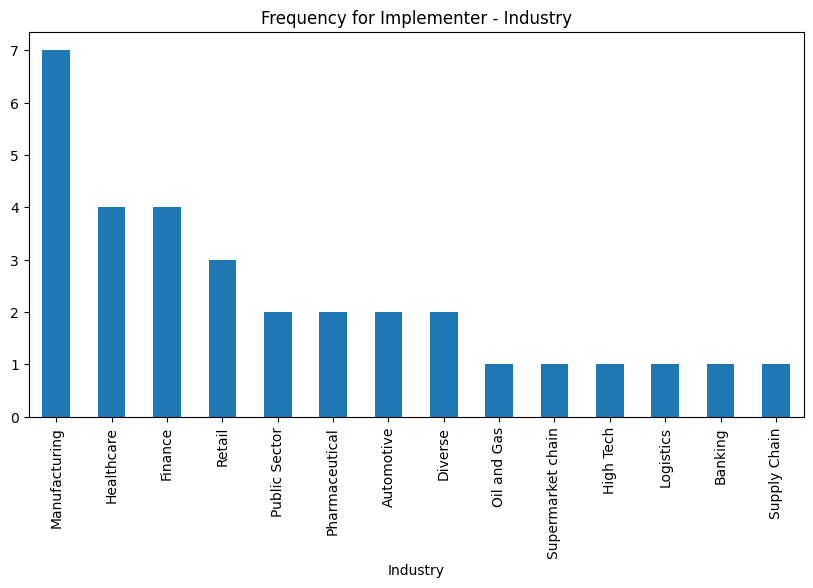

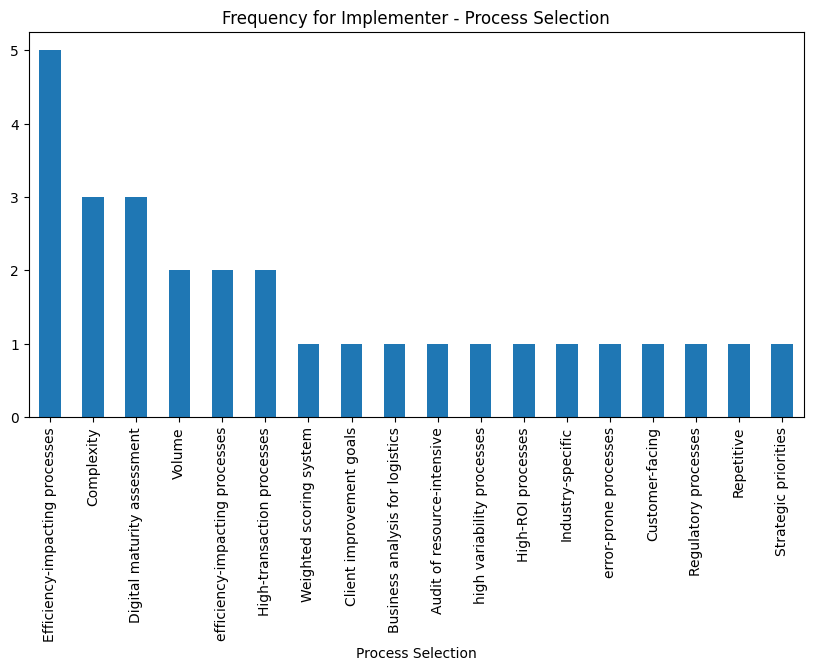

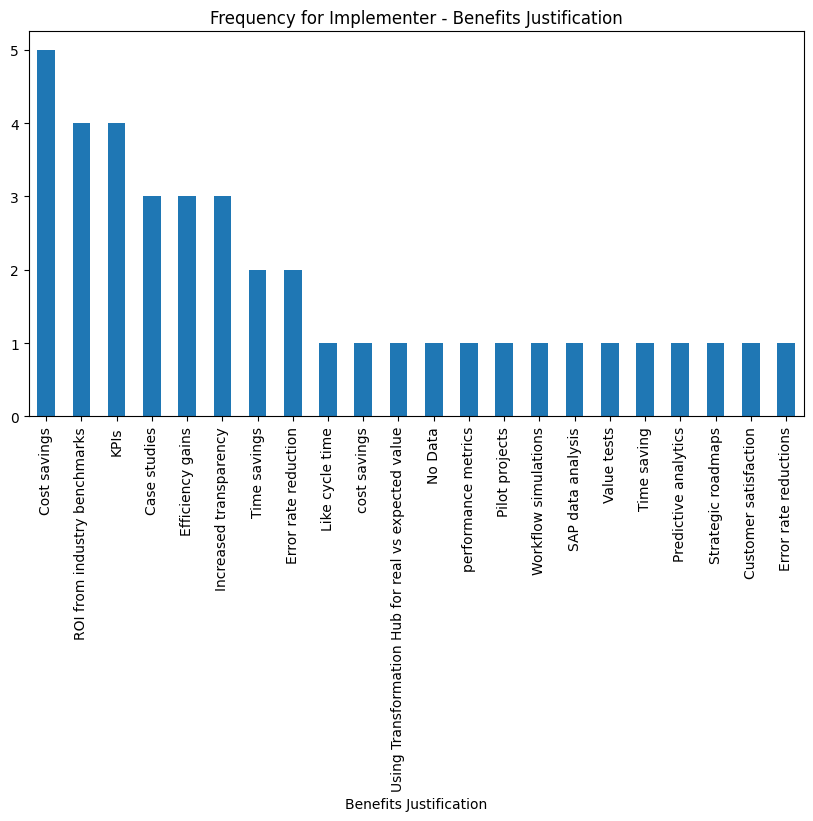

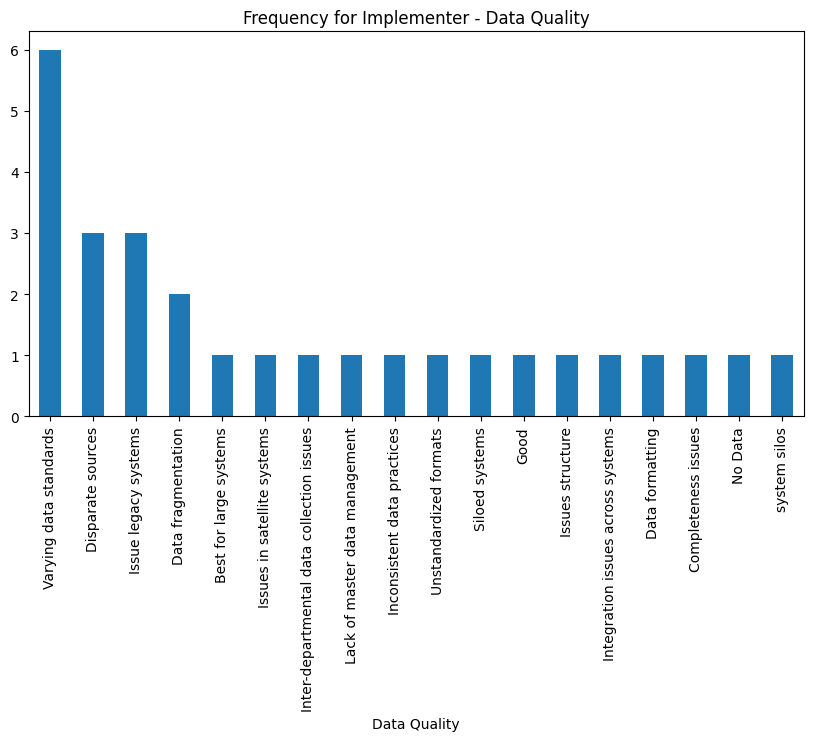

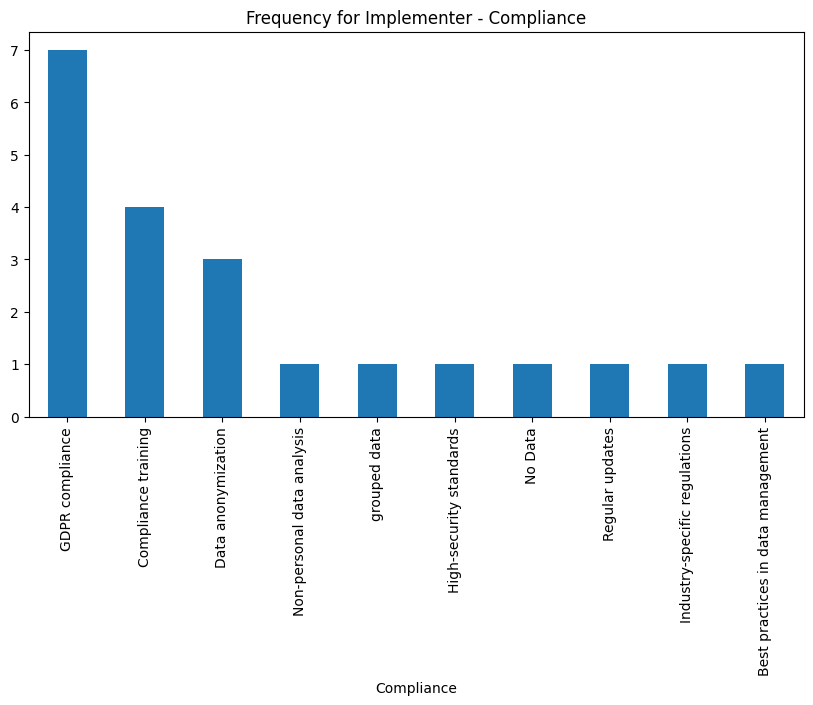

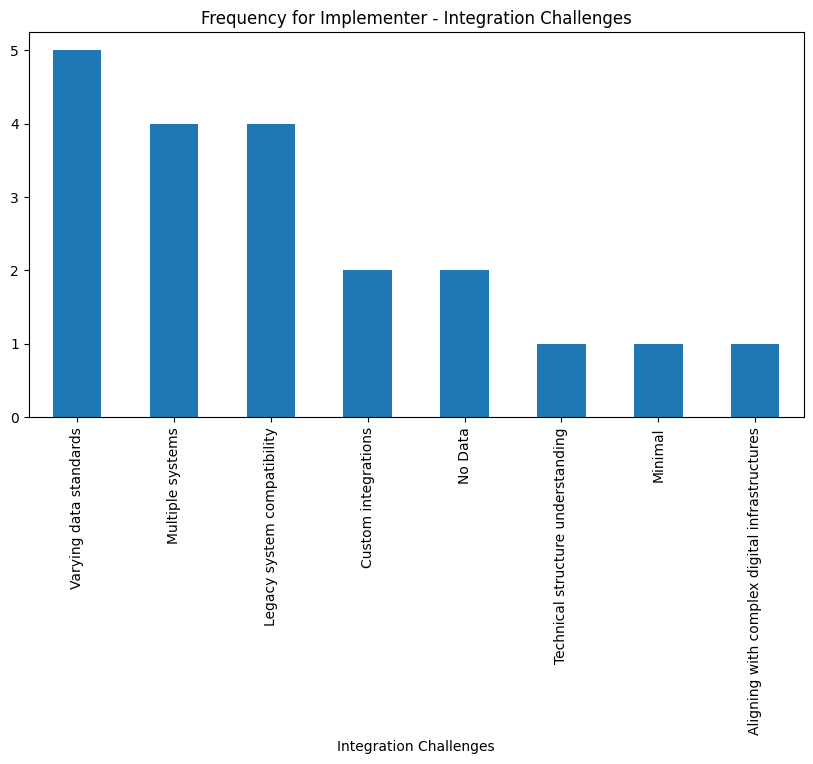

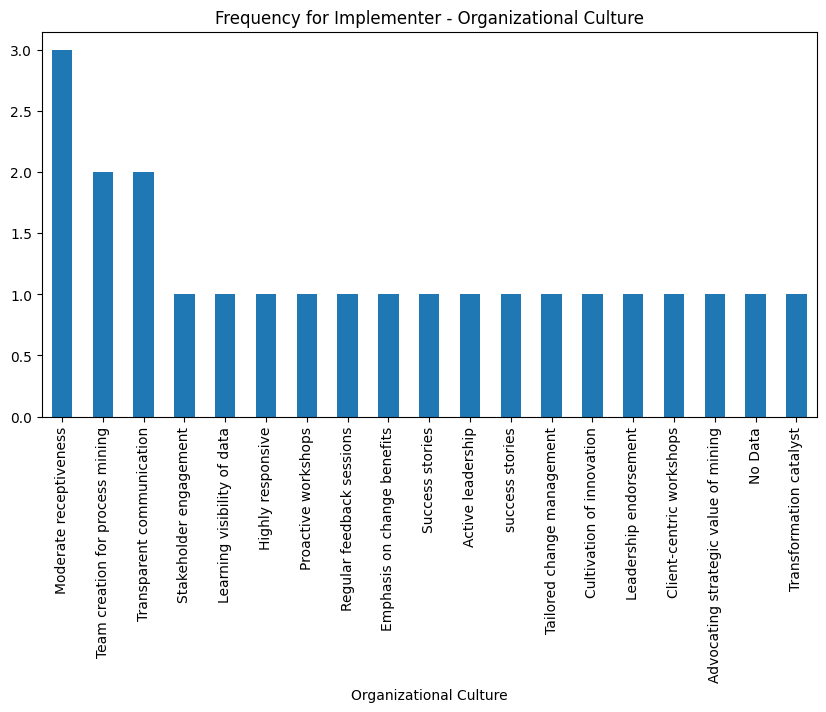

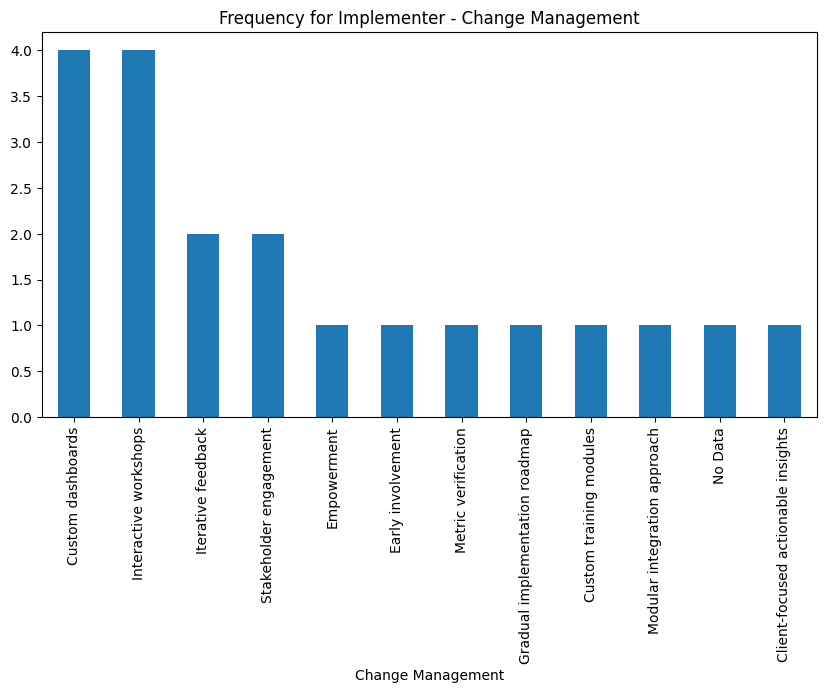

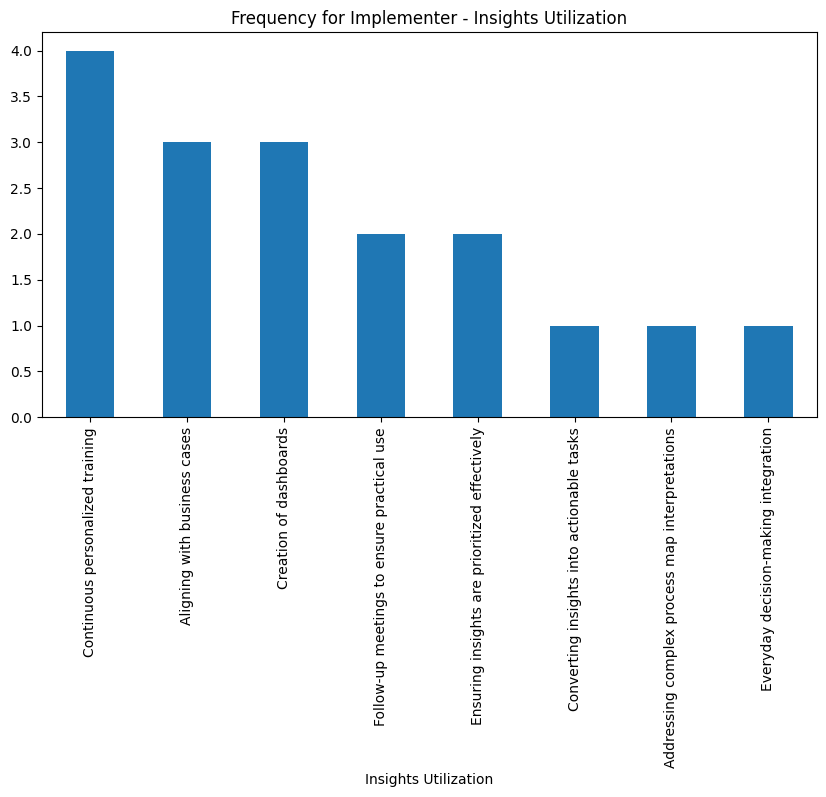

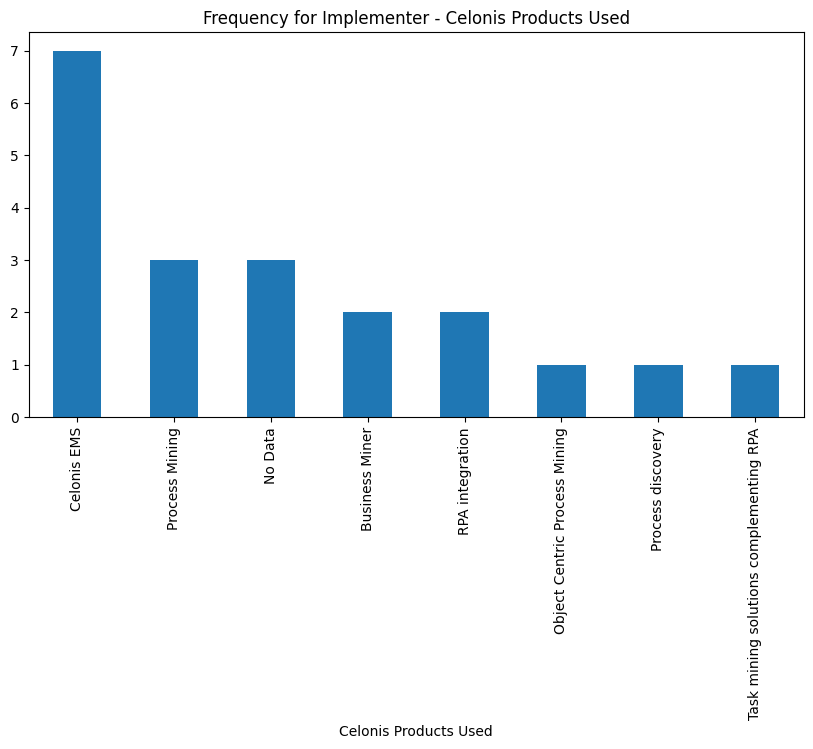

In [14]:
# Plot bar charts to visualize the frequency of categories for each implementer column
for col, tally_count in implementer_tally.items():
    plt.figure(figsize=(10,5))
    tally_count.sort_values(ascending=False).plot(kind='bar')
    plt.title(f'Frequency for Implementer - {col}')
    plt.show()

### Univariate Analysis for users: same as above but for user data

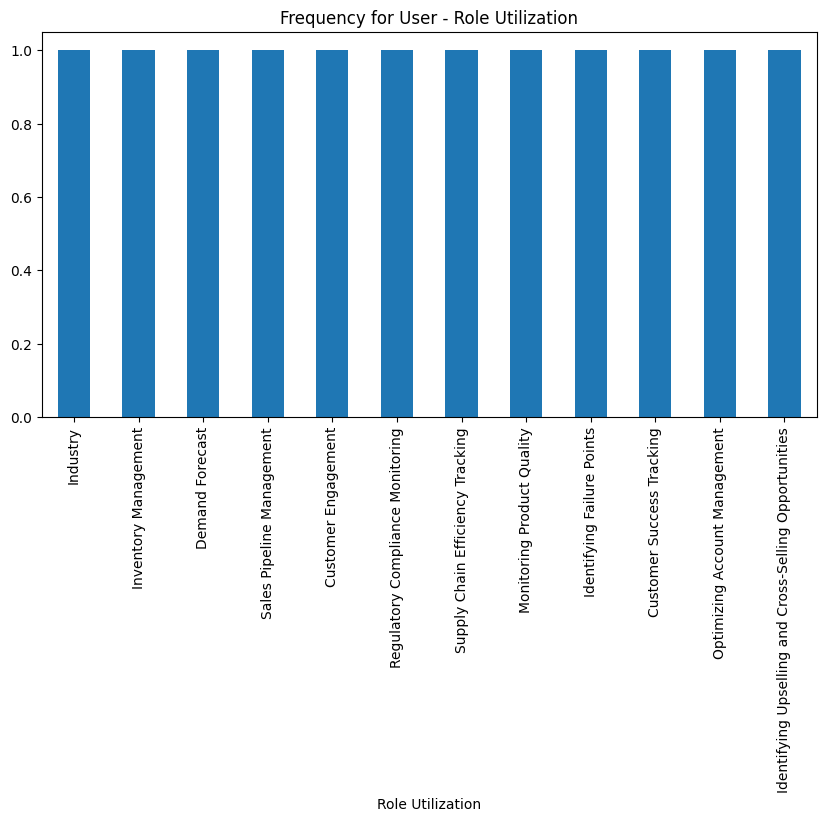

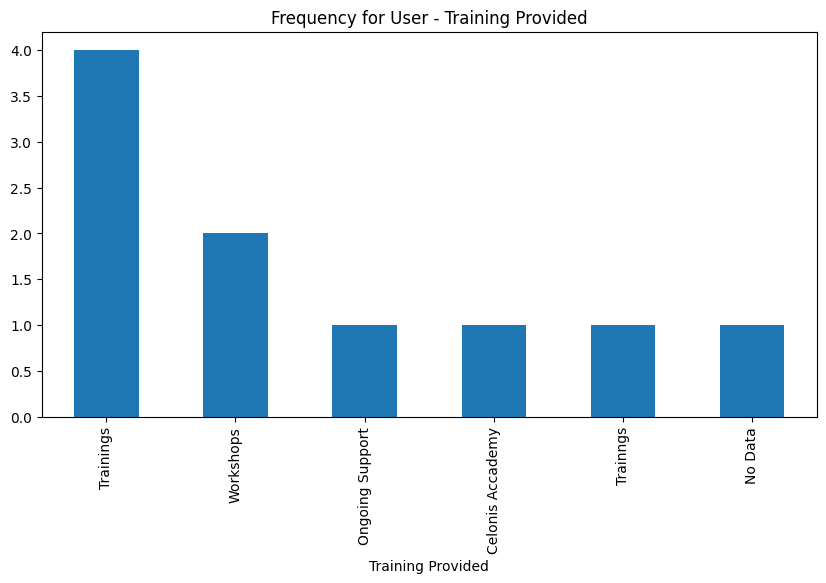

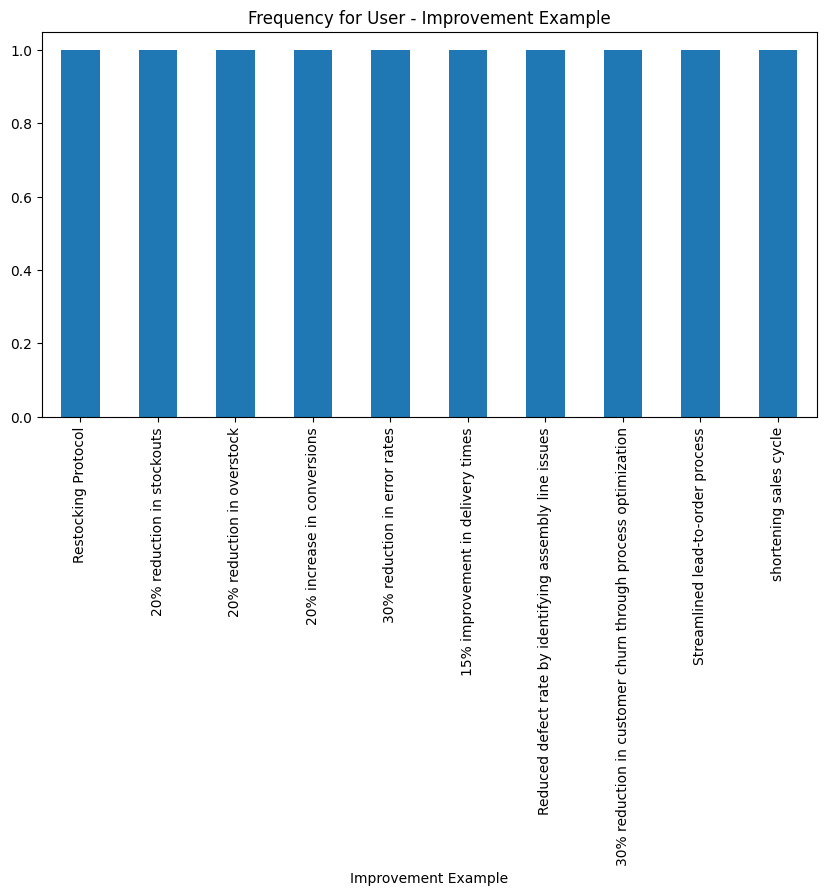

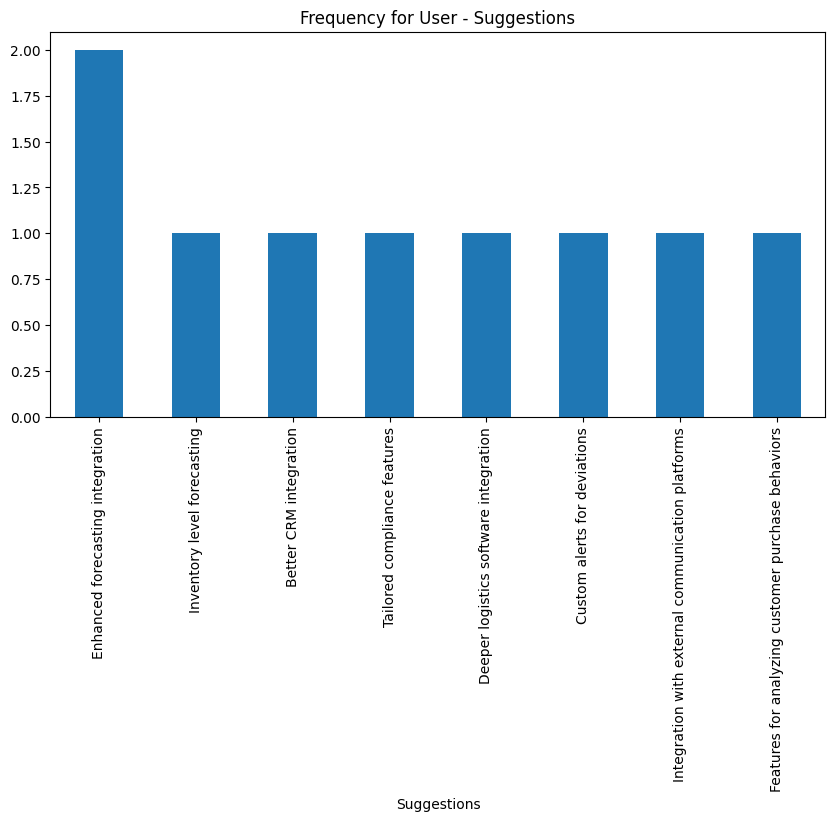

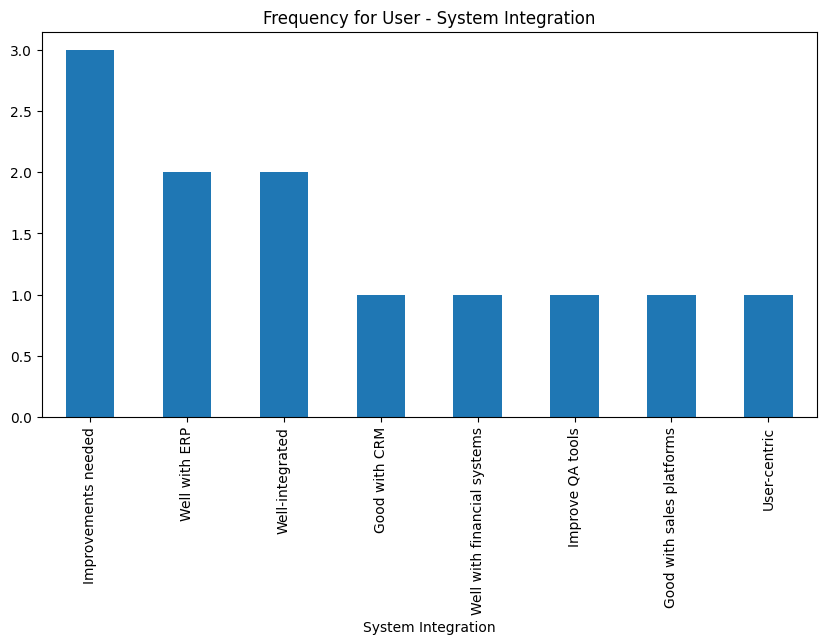

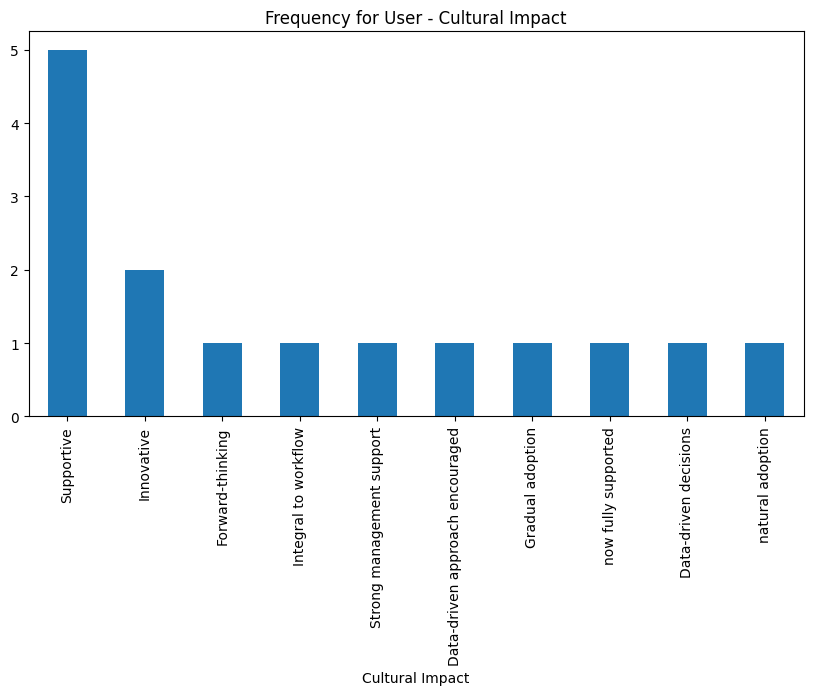

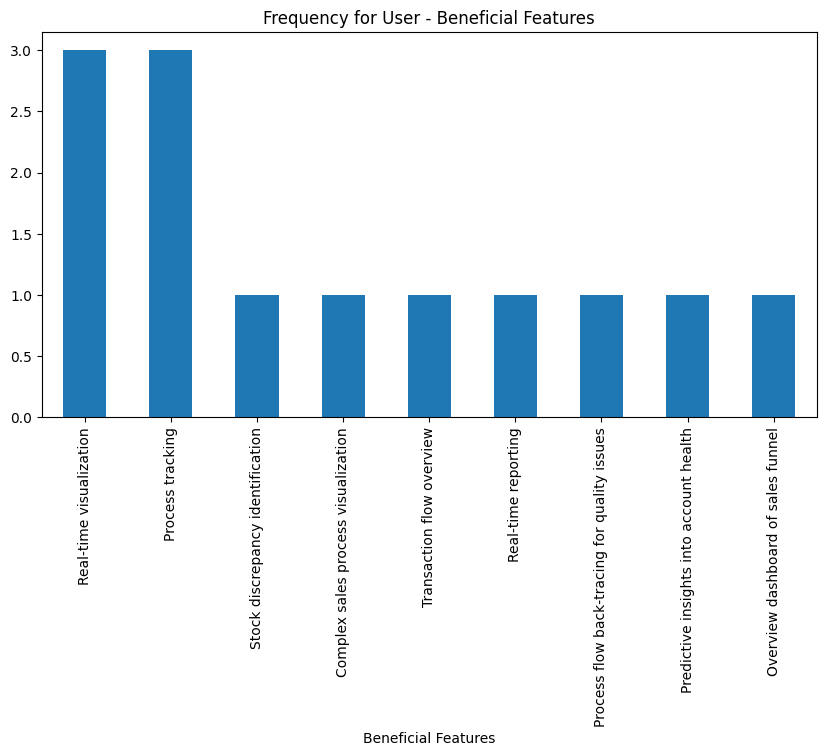

In [15]:
# Plot bar charts to visualize the frequency of categories for each user column
for col, count_data in user_category_counts.items():
    plt.figure(figsize=(10,5))
    count_data.sort_values(ascending=False).plot(kind='bar')
    plt.title(f'Frequency for User - {col}')
    plt.show()

###Numerical Univariate Analysis for Implementers: generate descriptive statistics and histograms

In [16]:
# Define a function to compute descriptive statistics for numerical columns in implementer data
def describe_numerical_implementers(df):
    # Select numerical columns only
    numerical_cols = df.select_dtypes(include=['int64', 'float64'])
    # Get descriptive statistics like mean, median, etc
    description = numerical_cols.describe()
    # Add the mode (most common value) to the description
    mode = numerical_cols.mode().loc[0]
    description.loc['mode'] = mode
    return description

# Call the descriptive statistics function for implementers and print the results
desc_stats_implementers = describe_numerical_implementers(data_implemeters)
print(desc_stats_implementers)


          Timestamp  Company size  Cost Consideration  Data Quality Rating  \
count     17.000000     17.000000           17.000000            17.000000   
mean   45386.437043   1494.117647            3.823529             3.882353   
std        5.209522   1307.894581            0.882843             0.696631   
min    45373.824334    200.000000            2.000000             2.000000   
25%    45383.583333    600.000000            3.000000             4.000000   
50%    45387.625000    600.000000            4.000000             4.000000   
75%    45389.634028   3000.000000            4.000000             4.000000   
max    45392.628472   3000.000000            5.000000             5.000000   
mode   45373.824334   3000.000000            4.000000             4.000000   

       Organizational Culture.1  Skill Gaps  
count                 17.000000   17.000000  
mean                   3.647059    4.176471  
std                    0.606339    0.951006  
min                    3.000000    

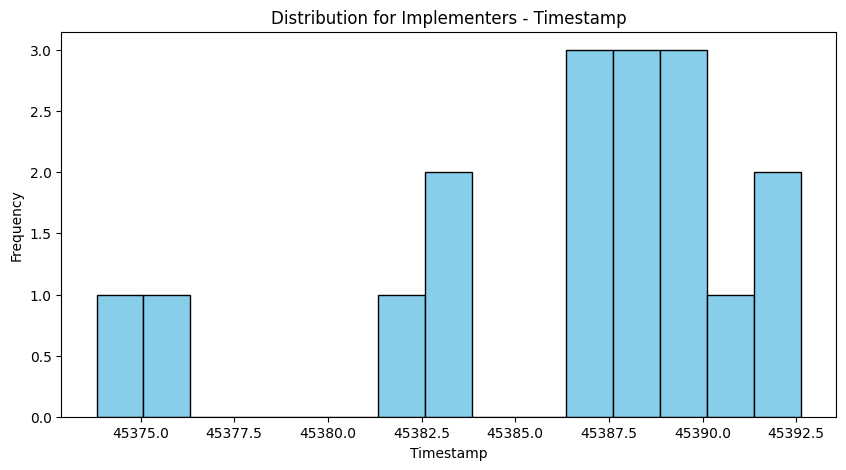

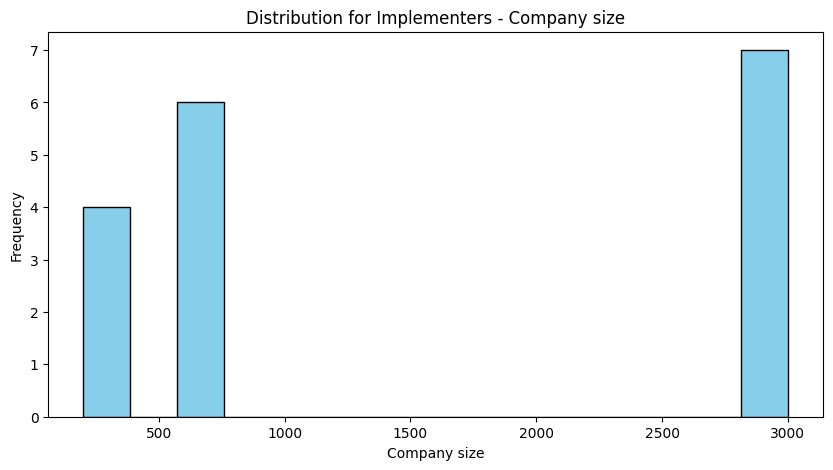

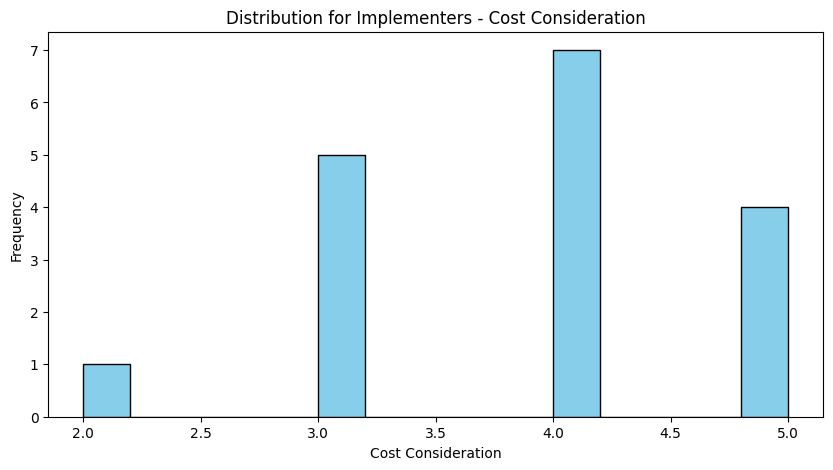

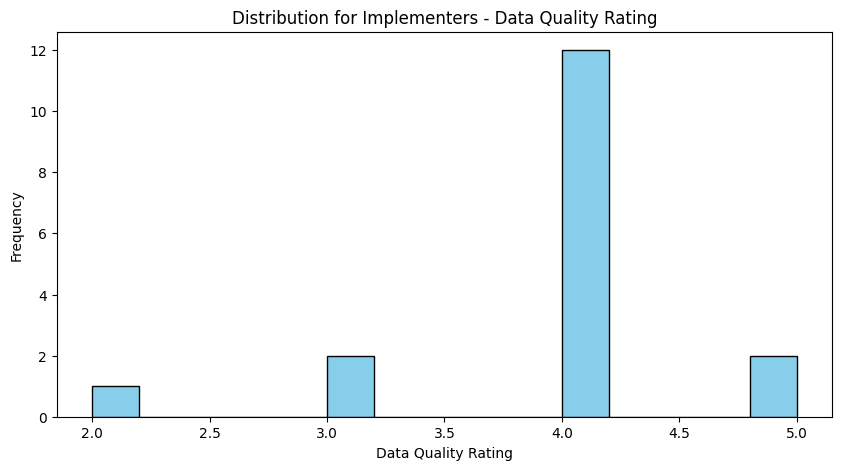

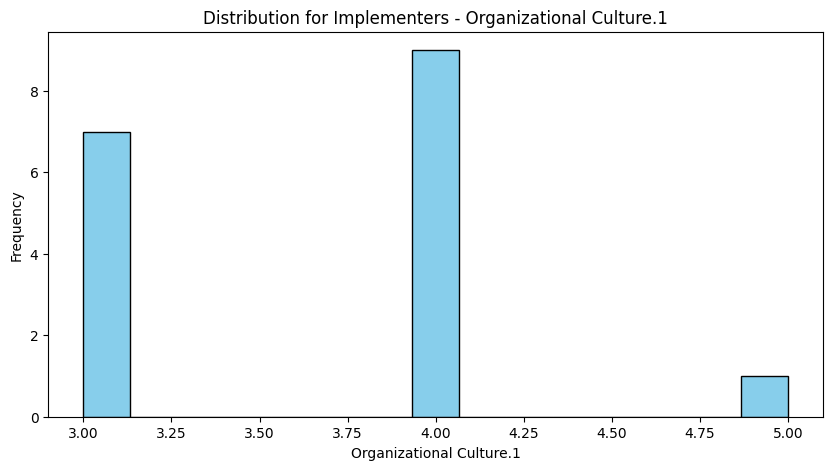

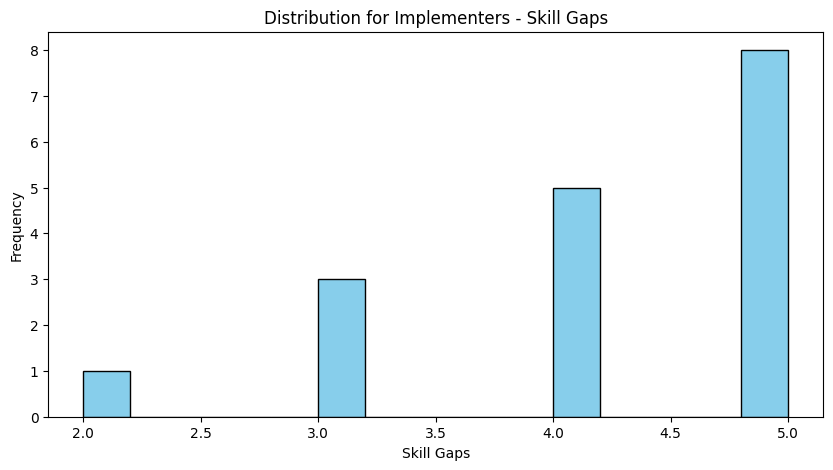

In [17]:
# Define a function to plot histograms for numerical columns in implementer data
def plot_numerical_histograms_implementers(df):
    # Get the list of numerical columns
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
    for col in numerical_cols:
        # Plot a histogram for each numerical column
        plt.figure(figsize=(10, 5))
        df[col].dropna().hist(bins=15, color='skyblue', edgecolor='black')
        plt.title(f'Distribution for Implementers - {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.grid(False)
        plt.show()

# Call the histogram plotting function for implementers.
plot_numerical_histograms_implementers(data_implemeters)


### Numerical Univariate Analysis for Users: similar descriptive statistics and histograms as implementers


In [18]:
# Define a function to compute descriptive statistics for numerical columns in user data
def describe_numerical_users(df):
    # Select numerical columns
    numerical_cols = df.select_dtypes(include=['int64', 'float64'])
    # Get descriptive statistics
    description = numerical_cols.describe()
    # Calculate and add the mode
    mode = numerical_cols.mode().loc[0]
    description.loc['mode'] = mode
    return description

# Call the descriptive statistics function for users and print the results
desc_stats_users = describe_numerical_users(data_users)
print(desc_stats_users)


          Timestamp  Company size    Impact
count      8.000000      8.000000  8.000000
mean   45439.897396   3125.000000  4.375000
std      108.981562   1866.050068  0.517549
min    45295.468750    500.000000  4.000000
25%    45340.393750   2375.000000  4.000000
50%    45477.684722   3000.000000  4.000000
75%    45516.179861   5000.000000  5.000000
max    45569.550694   5000.000000  5.000000
mode   45295.468750   3000.000000  4.000000


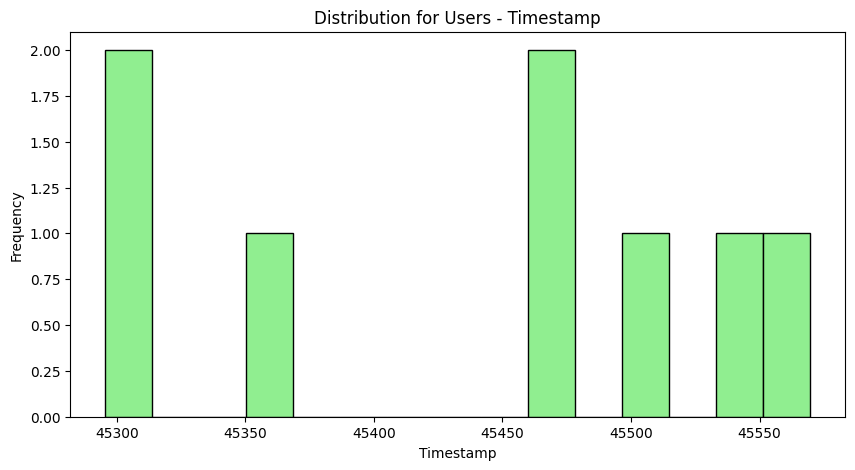

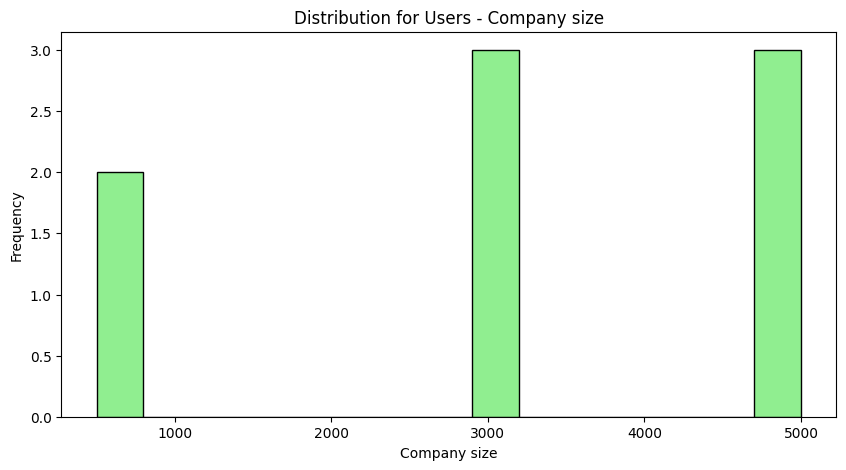

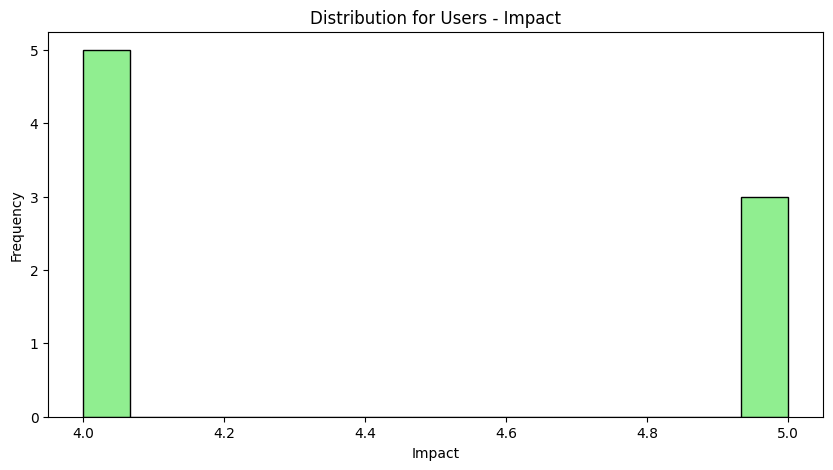

In [19]:
# Define a function to plot histograms for numerical columns in user data
def plot_numerical_histograms_users(df):
    # Get the list of numerical columns
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
    for col in numerical_cols:
        # Plot a histogram for each numerical column
        plt.figure(figsize=(10, 5))
        df[col].dropna().hist(bins=15, color='lightgreen', edgecolor='black')
        plt.title(f'Distribution for Users - {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.grid(False)
        plt.show()

# Call the histogram plotting function for users
plot_numerical_histograms_users(data_users)


## 4) Bivariate Analysis

### Bivariate Analysis for Implementers: analyze the relationship between pairs of numerical variables

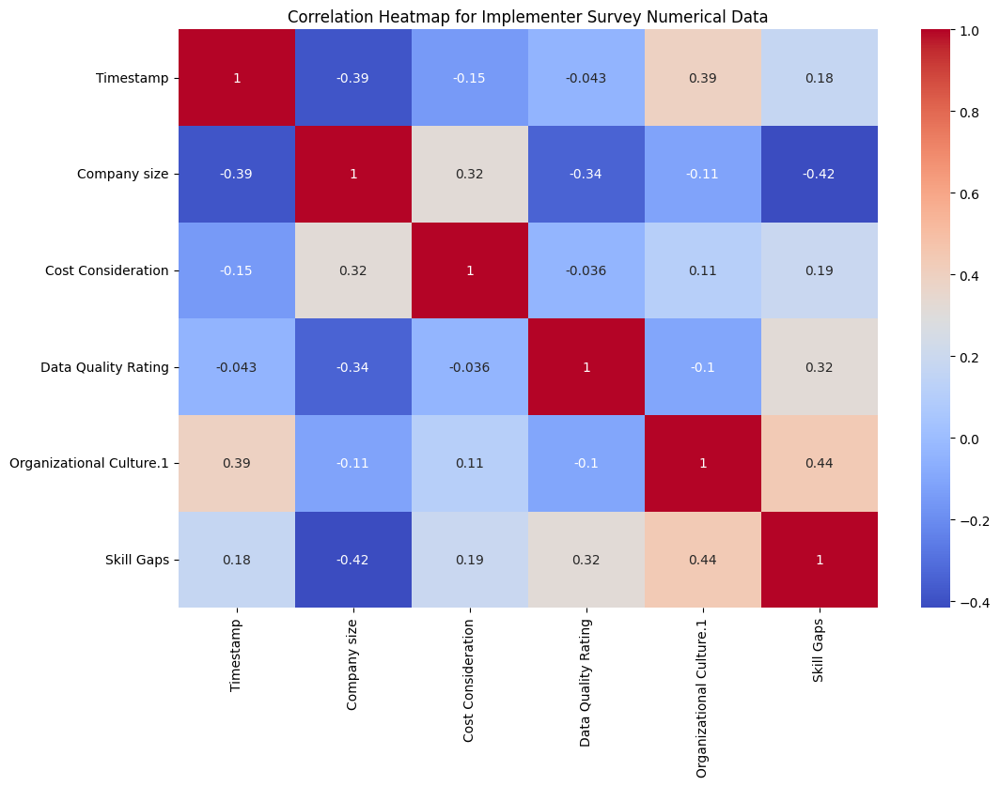

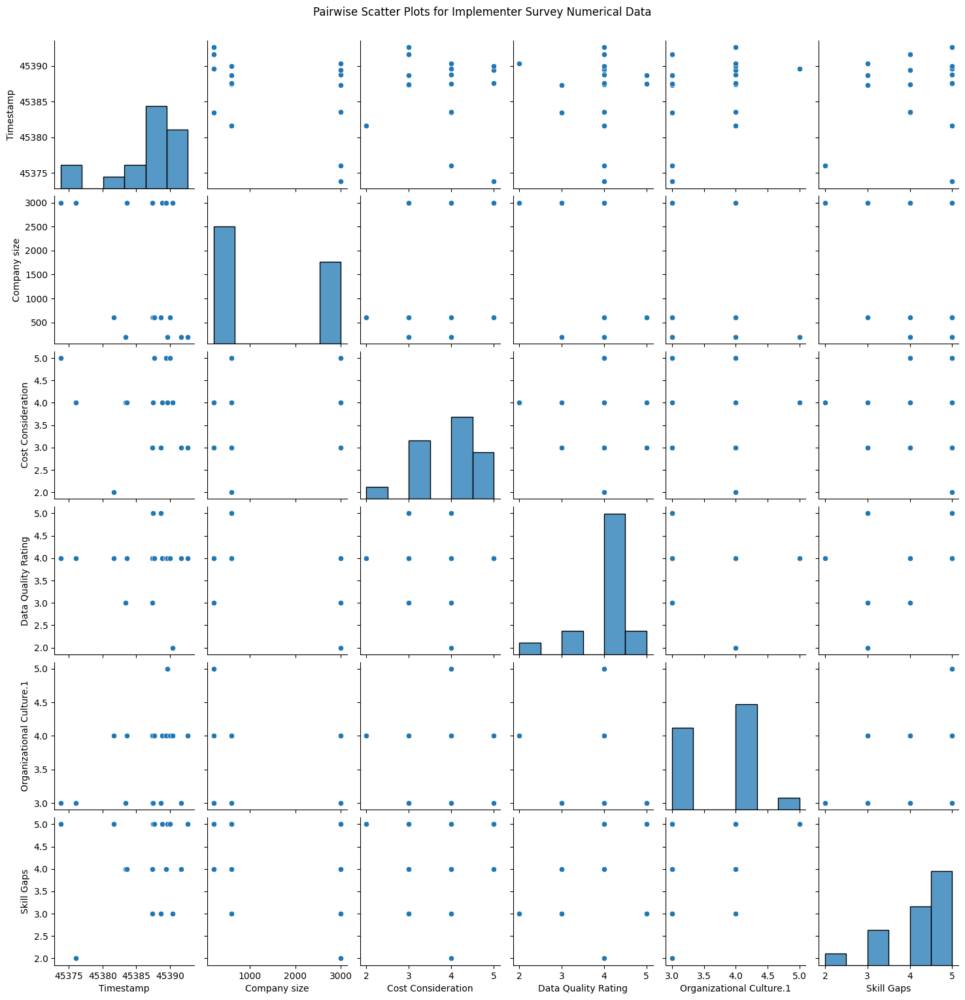

In [20]:
# Define a function for bivariate analysis on numerical columns of implementer data
def bivariate_analysis_implementers(df):
    # Select numerical columns only
    numerical_cols = df.select_dtypes(include=['int64', 'float64'])
    # Compute the correlation matrix for numerical columns
    corr_matrix = numerical_cols.corr()
    # Plot a heatmap to visualize the correlation matrix
    plt.figure(figsize=(12,8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
    plt.title('Correlation Heatmap for Implementer Survey Numerical Data')
    plt.show()

    # Plot pairwise scatterplots for the numerical columns to inspect relationships
    sns.pairplot(numerical_cols)
    plt.suptitle('Pairwise Scatter Plots for Implementer Survey Numerical Data', y=1.02)
    plt.show()

# Call the bivariate analysis function for the implementer survey data
bivariate_analysis_implementers(data_implemeters)


### Bivariate Analysis for Users: analyze relationships between numerical variables for user data

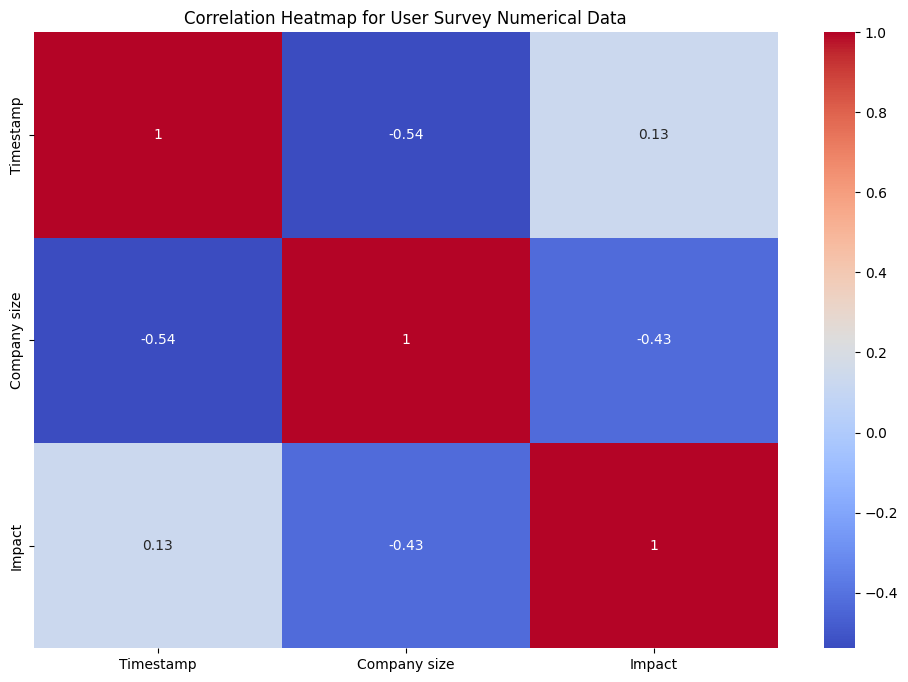

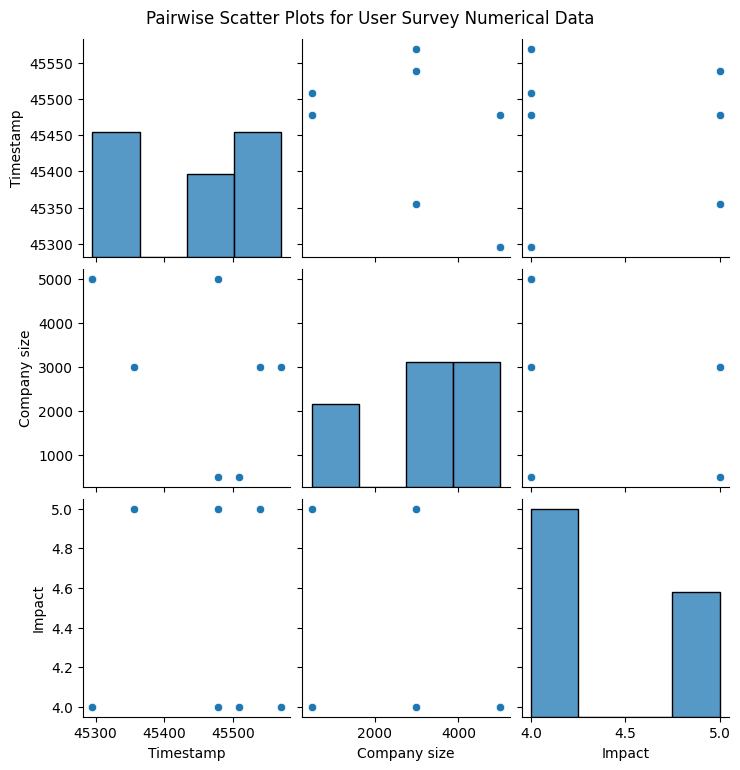

In [21]:
#Define a function for bivariate analysis on numerical columns of user data
def bivariate_analysis_users(df):
    # Select numerical columns only
    numerical_cols = df.select_dtypes(include=['int64', 'float64'])
    # Compute the correlation matrix for numerical columns
    corr_matrix = numerical_cols.corr()
    # Plot a heatmap to visualize the correlation matrix
    plt.figure(figsize=(12,8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
    plt.title('Correlation Heatmap for User Survey Numerical Data')
    plt.show()

    # Plot pairwise scatterplots for the numerical columns to inspect relationships
    sns.pairplot(numerical_cols)
    plt.suptitle('Pairwise Scatter Plots for User Survey Numerical Data', y=1.02)
    plt.show()

# Call the bivariate analysis function for the user survey data
bivariate_analysis_users(data_users)


### Bivariate Analysis for Implementers Categorical: analyze relationships between pairs of categorical variables

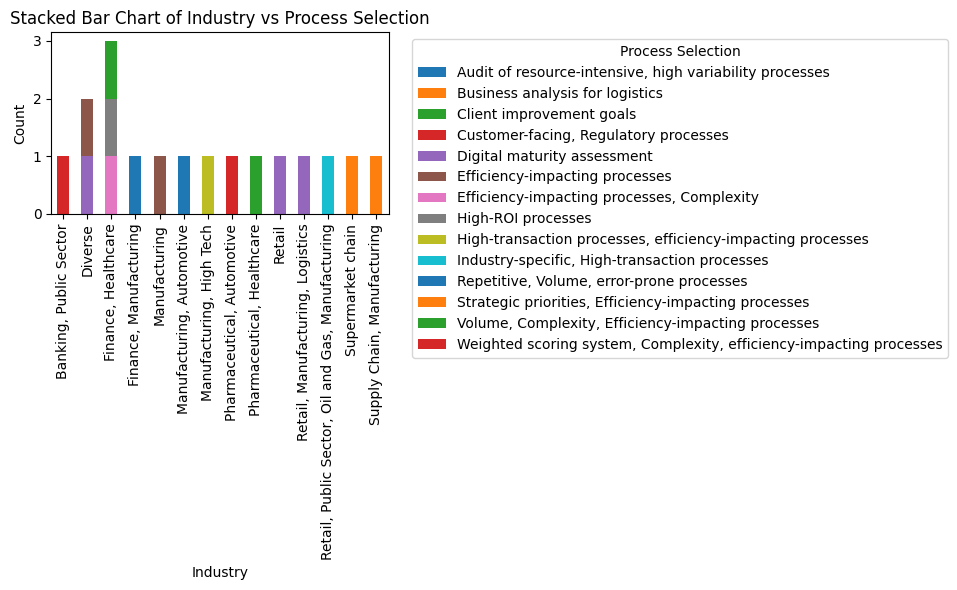

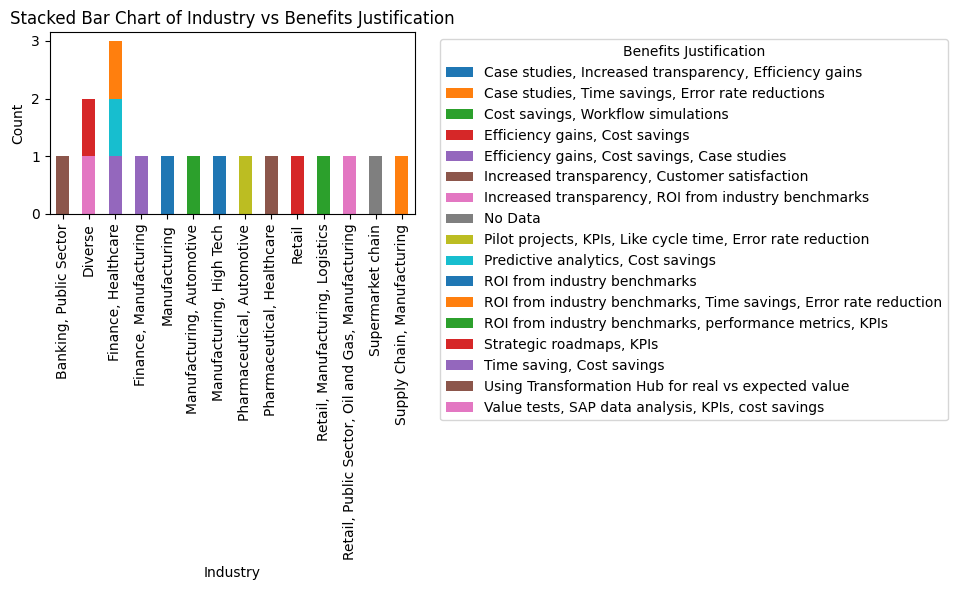

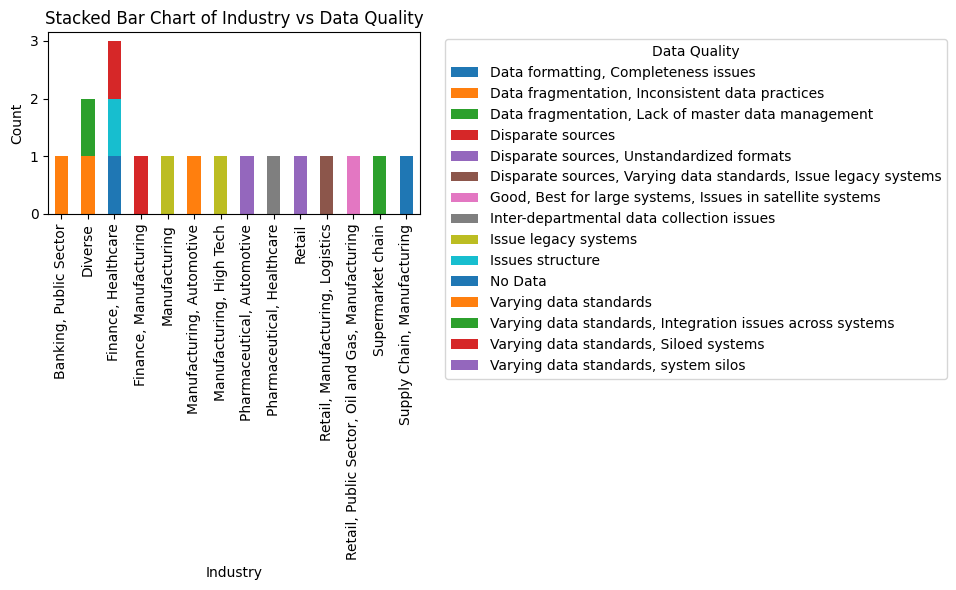

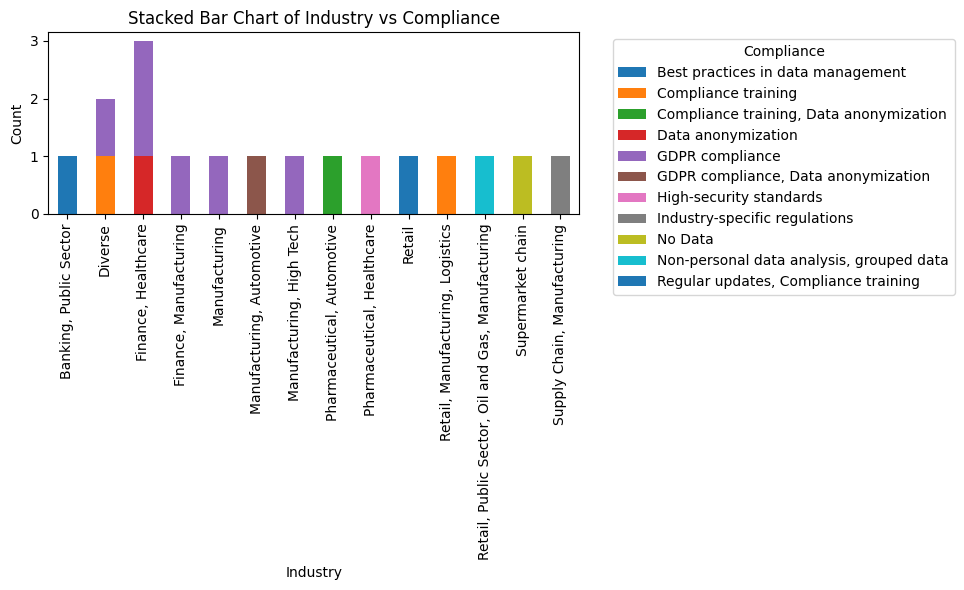

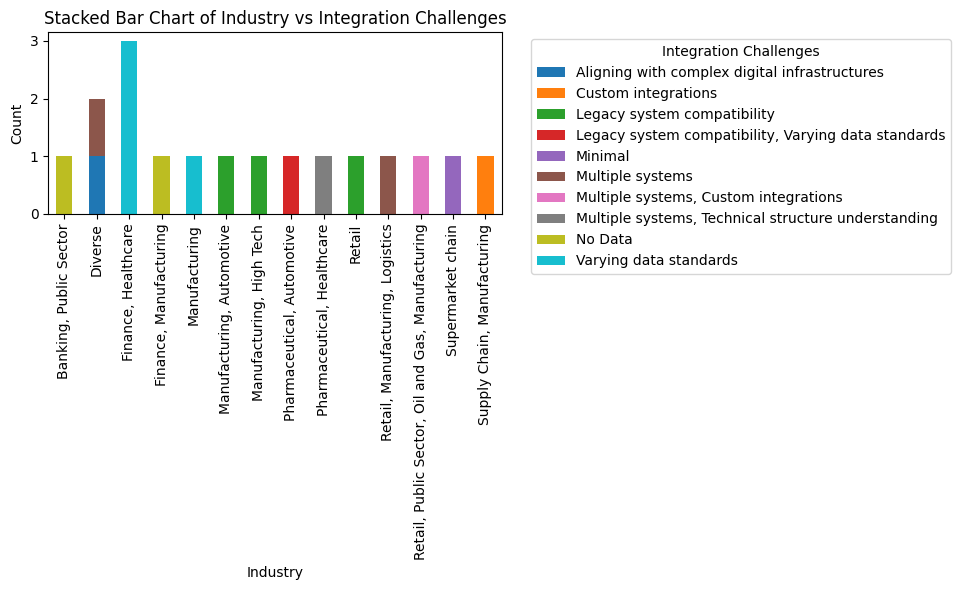

...

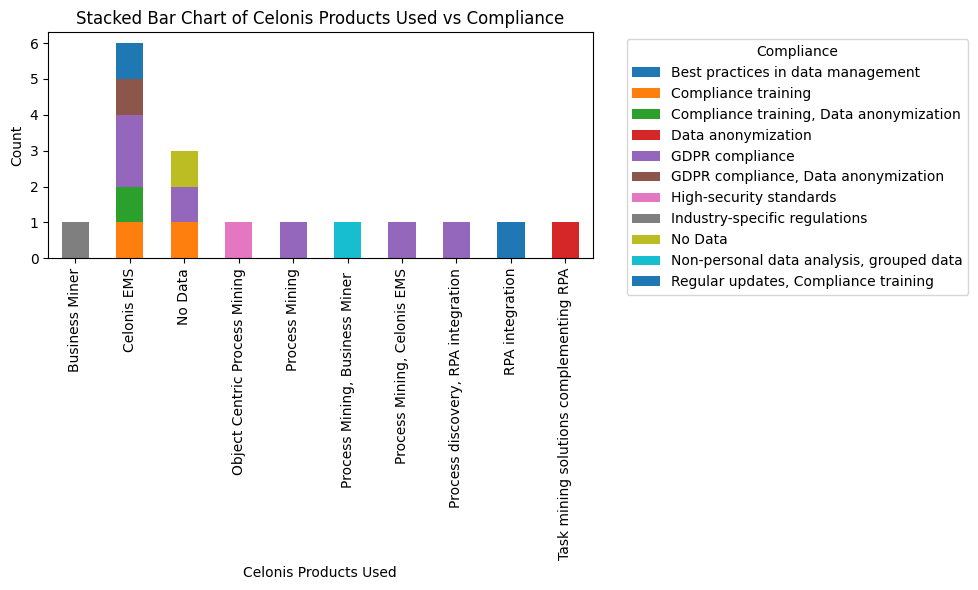

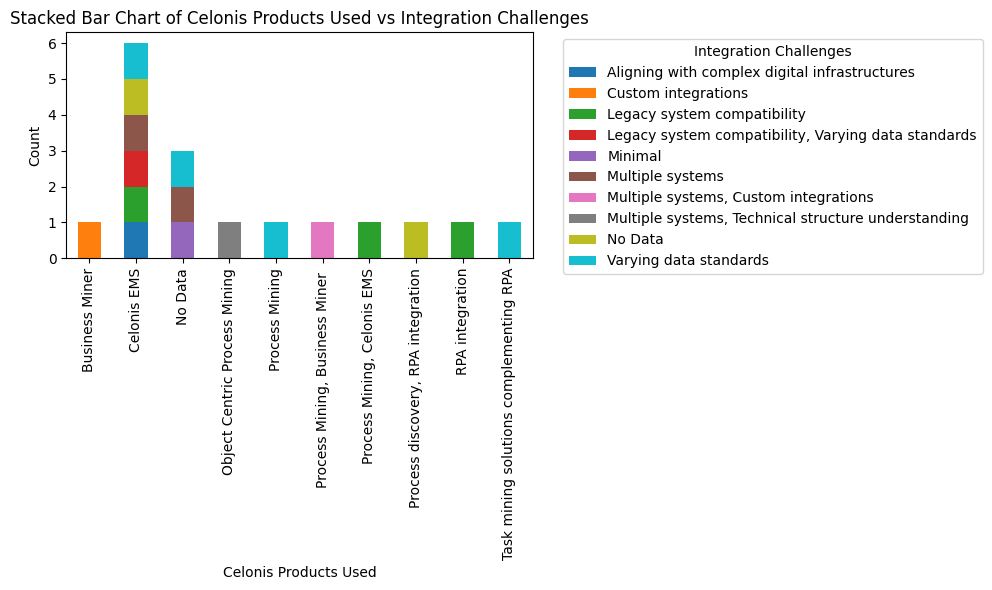

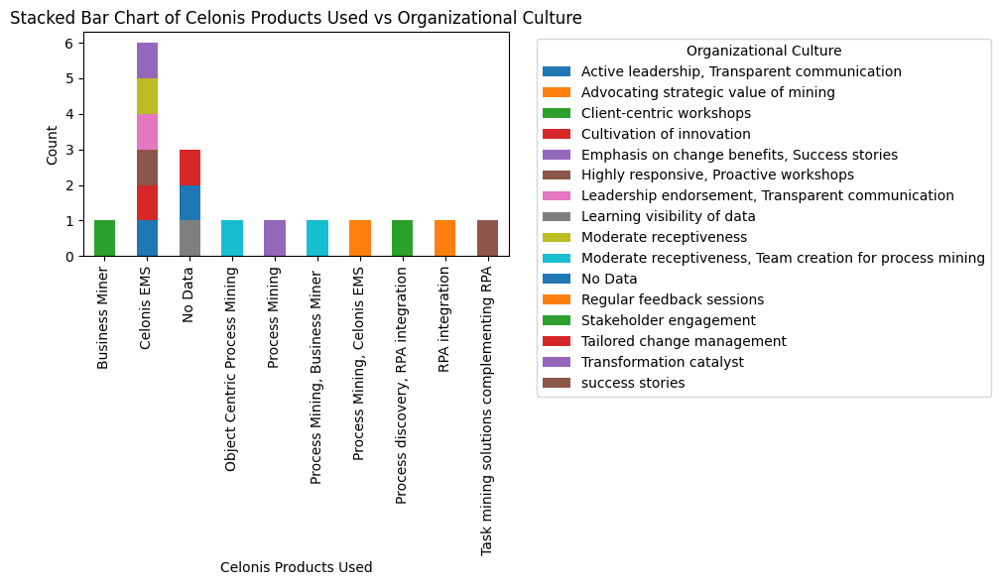

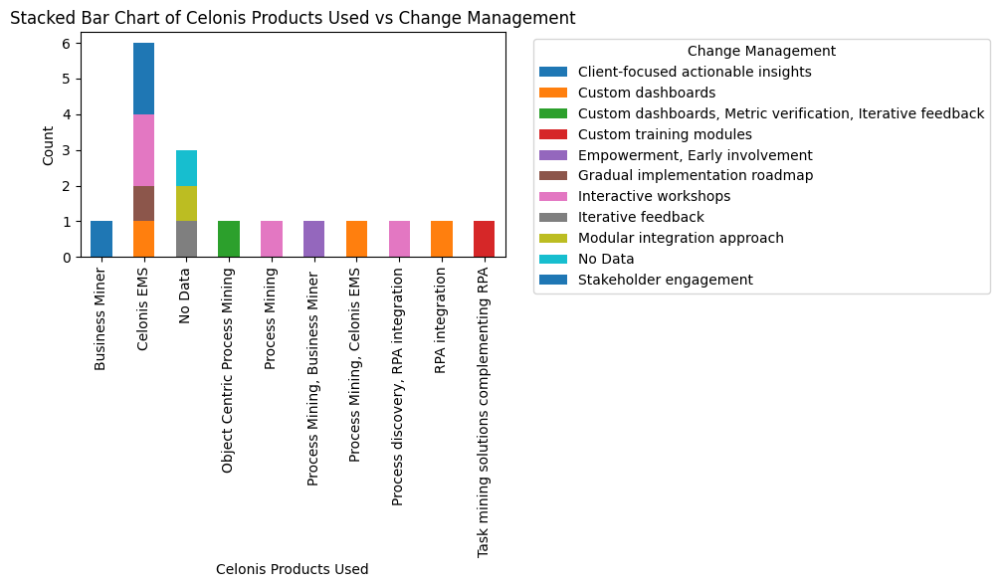

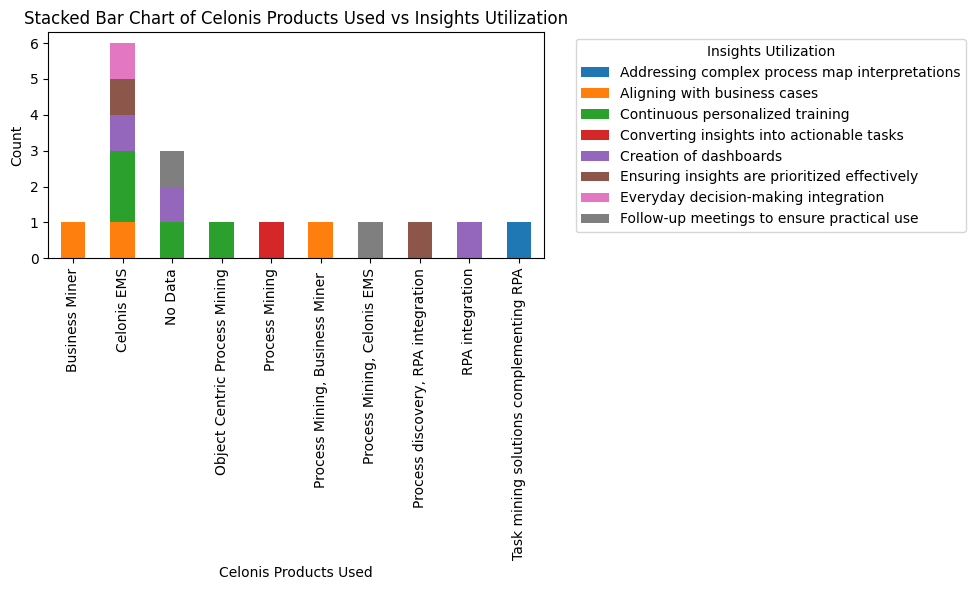

In [22]:
## Define a function to plot relationships between pairs of categorical columns for implementers
def plot_categorical_relations_implementers(df, categorical_columns):
    for col1 in categorical_columns:
        for col2 in categorical_columns:
            if col1 != col2:
                # Create a cross-tabulation table between two categorical columns
                crosstab = pd.crosstab(df[col1], df[col2], margins=False)

                # Plot a stacked bar chart to show the relationship between the two categories
                crosstab.plot(kind='bar', stacked=True, figsize=(10,6))
                plt.title(f'Stacked Bar Chart of {col1} vs {col2}')
                plt.xlabel(col1)
                plt.ylabel('Count')
                plt.legend(title=col2, bbox_to_anchor=(1.05, 1), loc='upper left')
                plt.tight_layout()
                plt.show()

# List of categorical columns to analyze for implementers (categorical variables)
categorical_columns_implementers = [    'Industry', 'Process Selection', 'Benefits Justification',
    'Data Quality', 'Compliance', 'Integration Challenges',
    'Organizational Culture', 'Change Management',
    'Insights Utilization', 'Celonis Products Used']

# Call the function to plot the relationships for implementers
plot_categorical_relations_implementers(data_implemeters, categorical_columns_implementers)


### Bivariate Analysis for Users Categorical: same process as for implementers but for user data

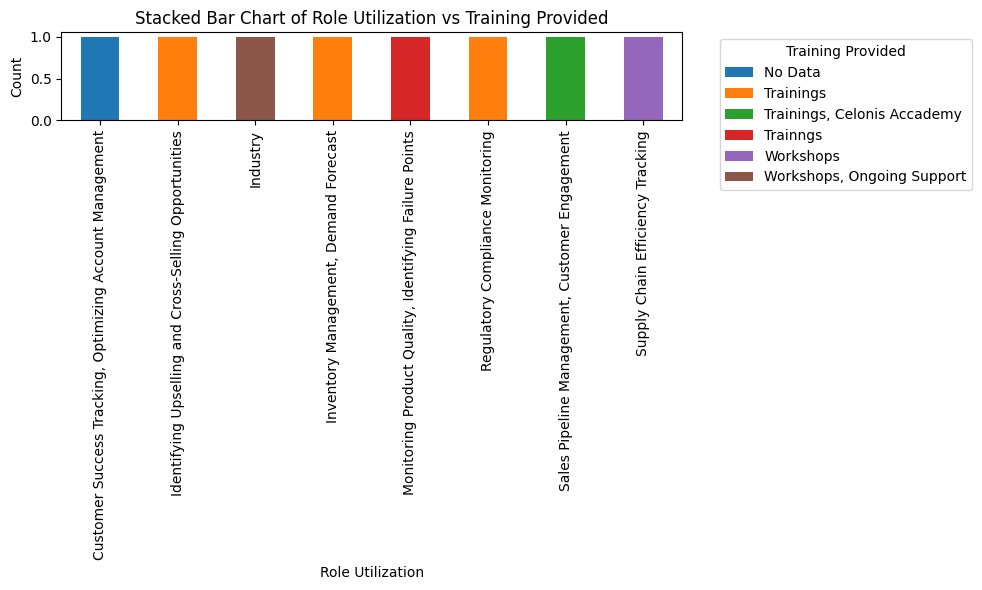

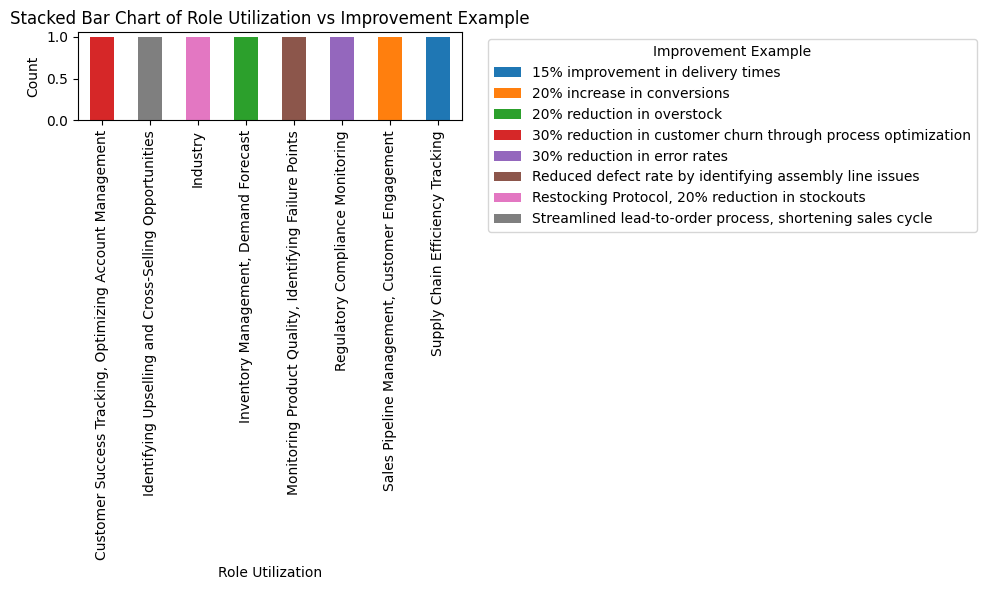

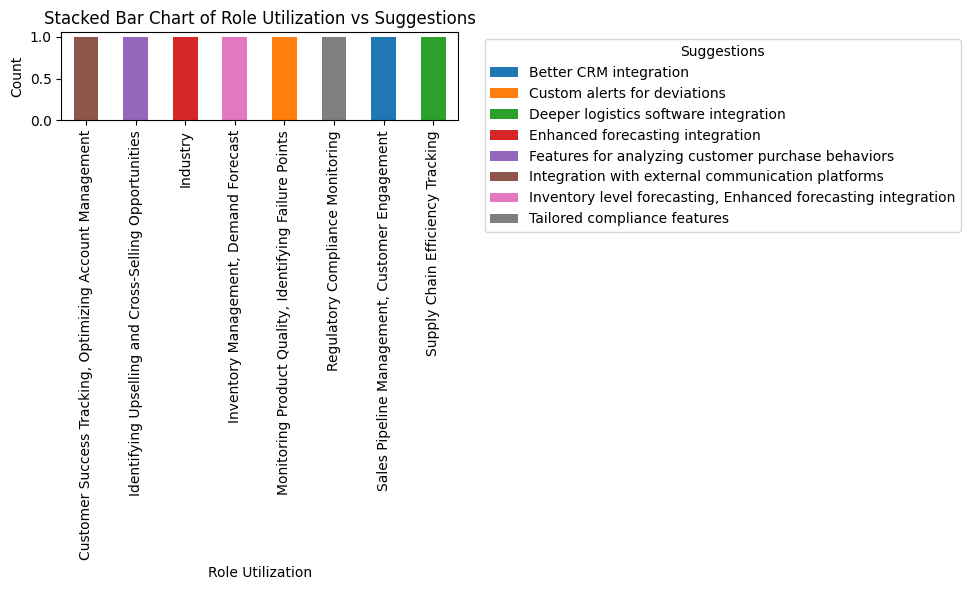

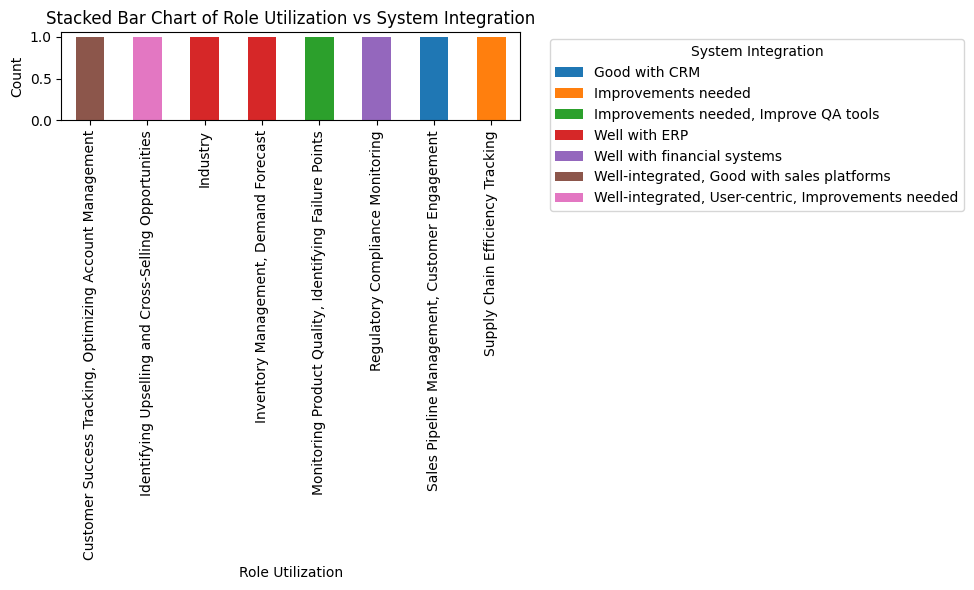

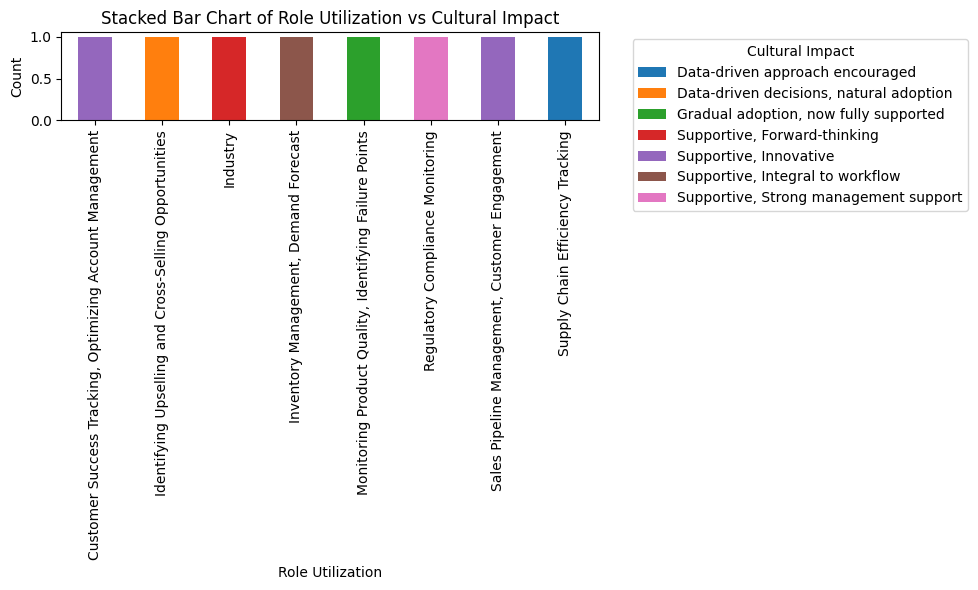

...

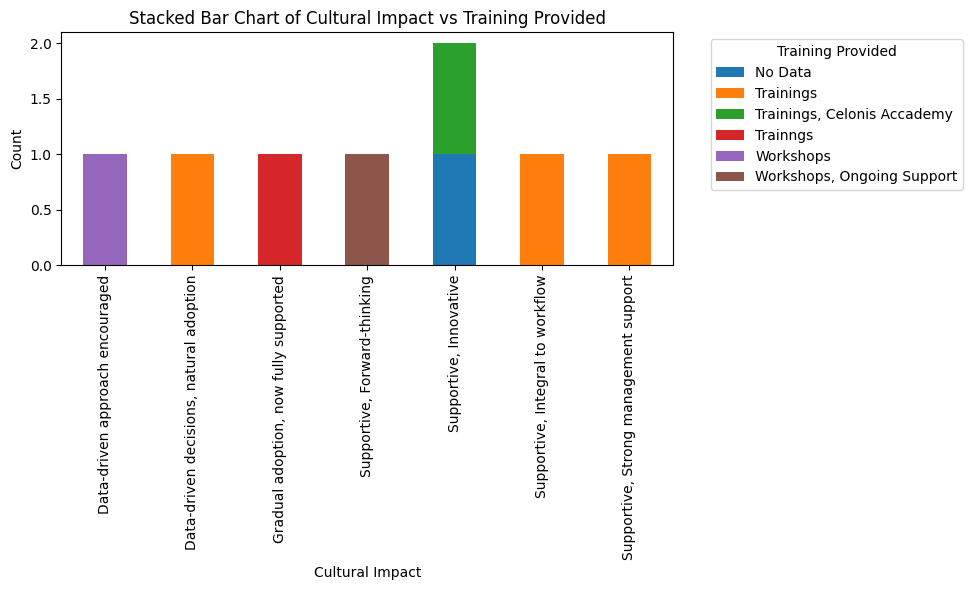

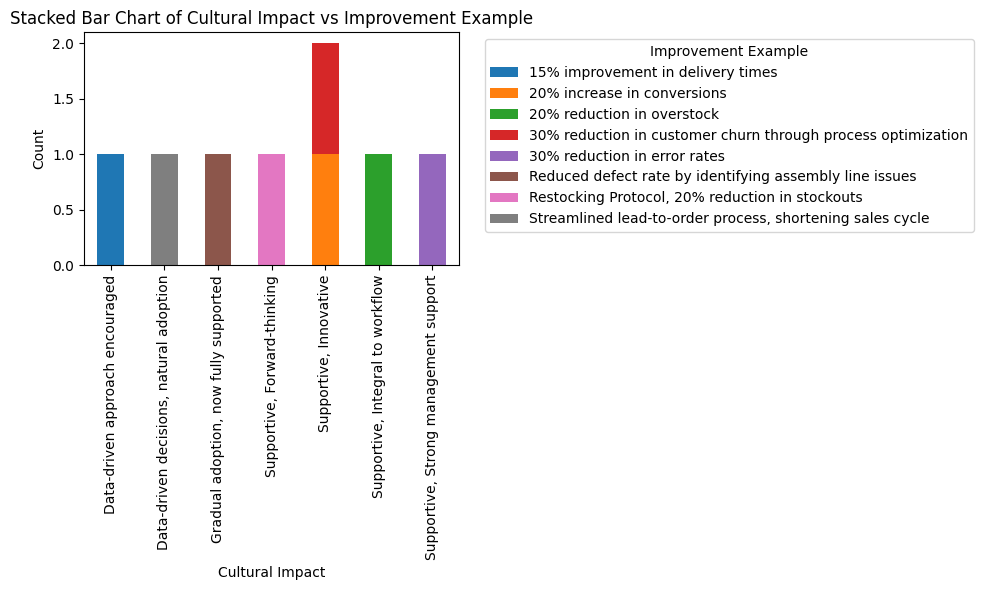

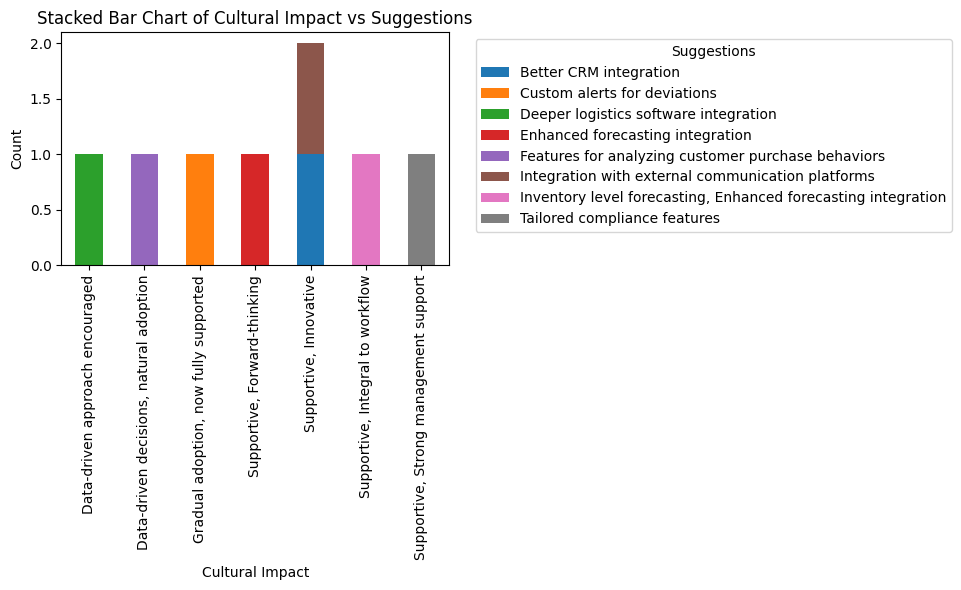

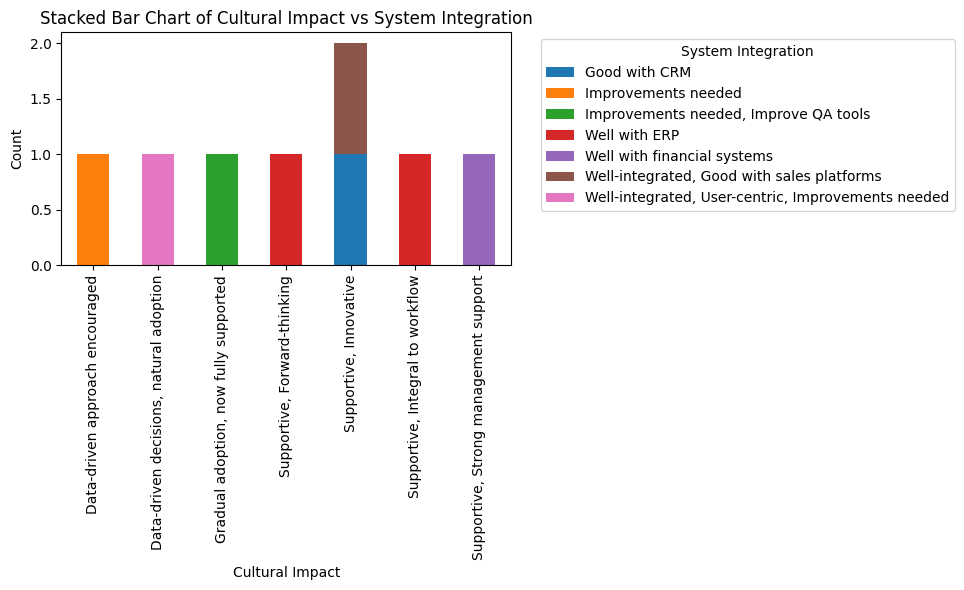

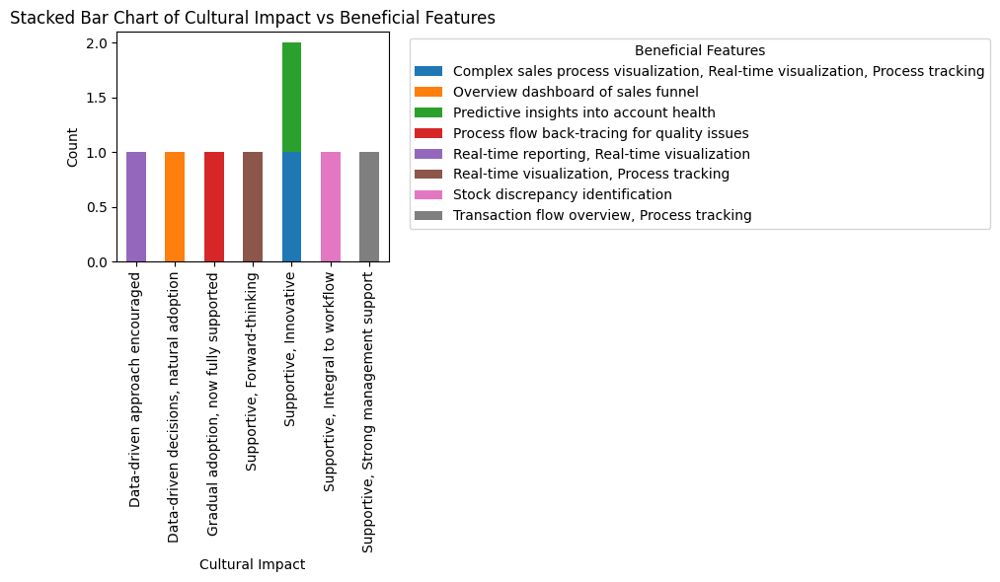

<ipython-input-23-9aa9a08ee4bf>:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


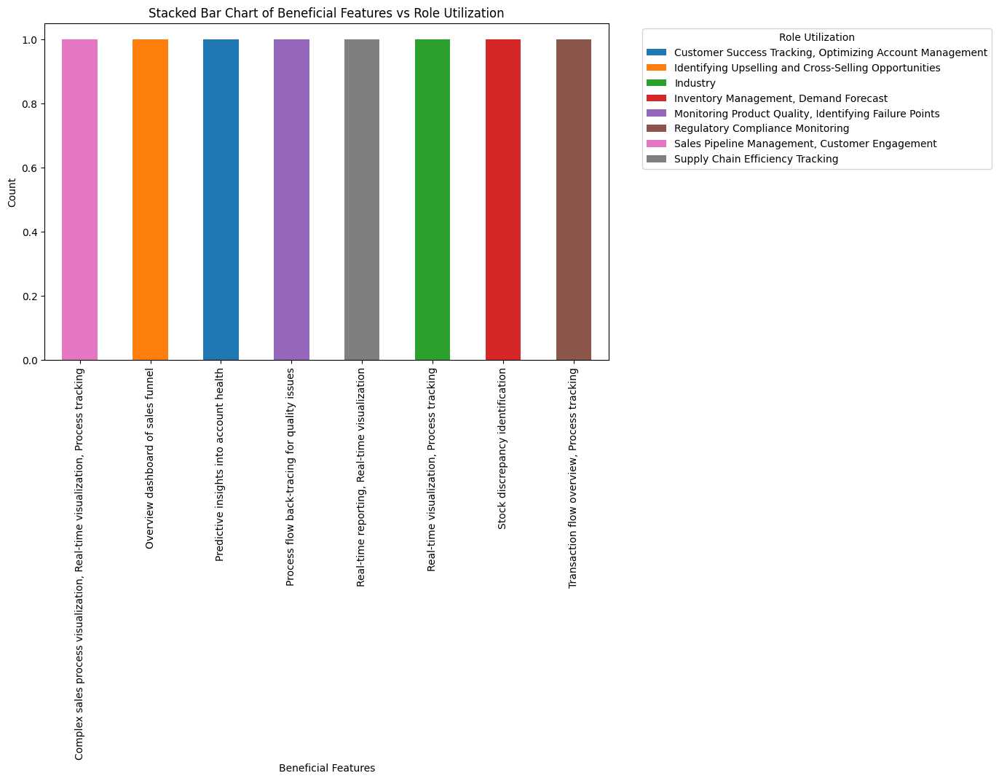

<ipython-input-23-9aa9a08ee4bf>:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


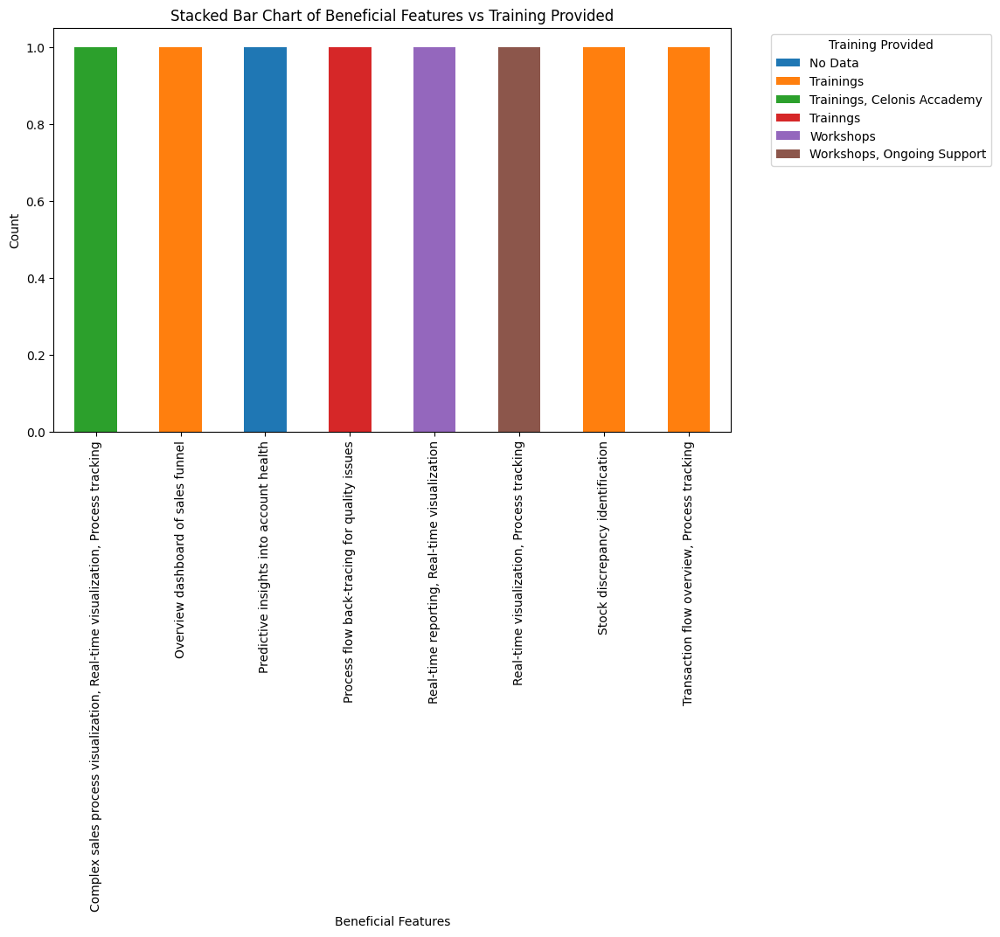

<ipython-input-23-9aa9a08ee4bf>:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


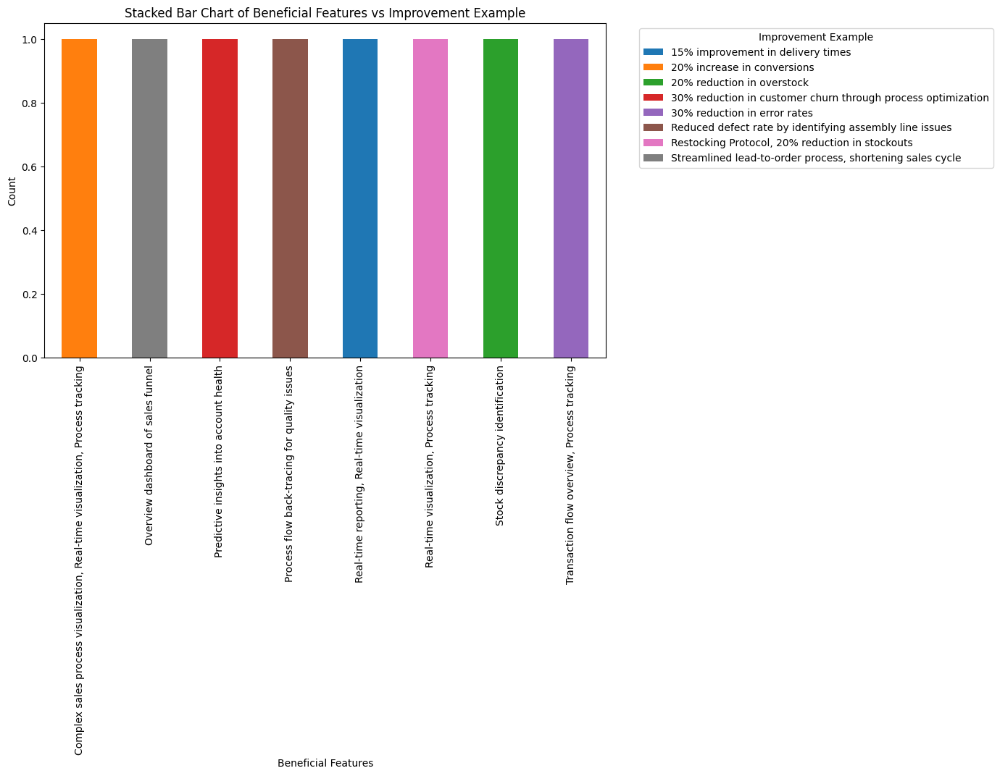

<ipython-input-23-9aa9a08ee4bf>:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


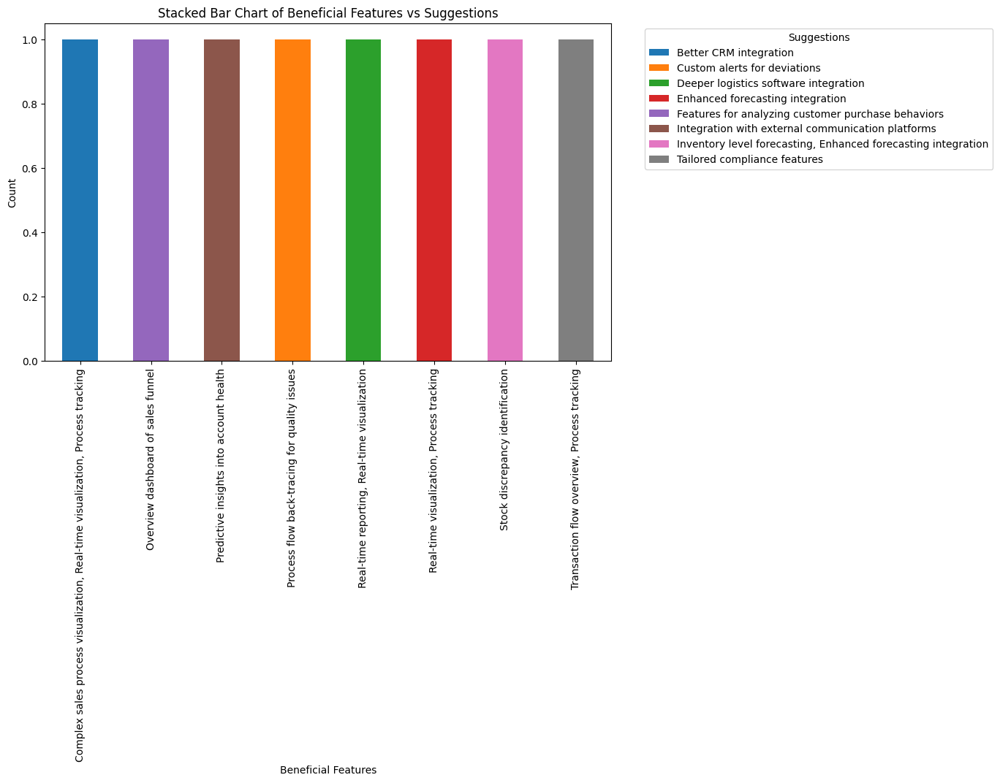

<ipython-input-23-9aa9a08ee4bf>:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


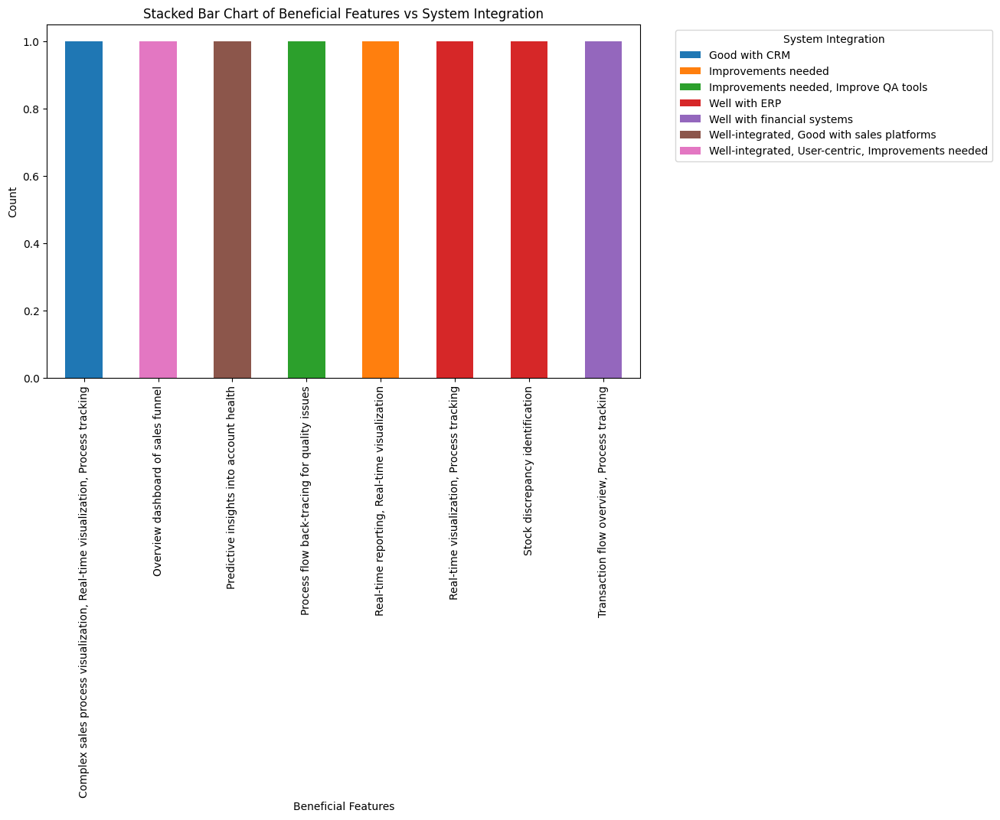

<ipython-input-23-9aa9a08ee4bf>:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


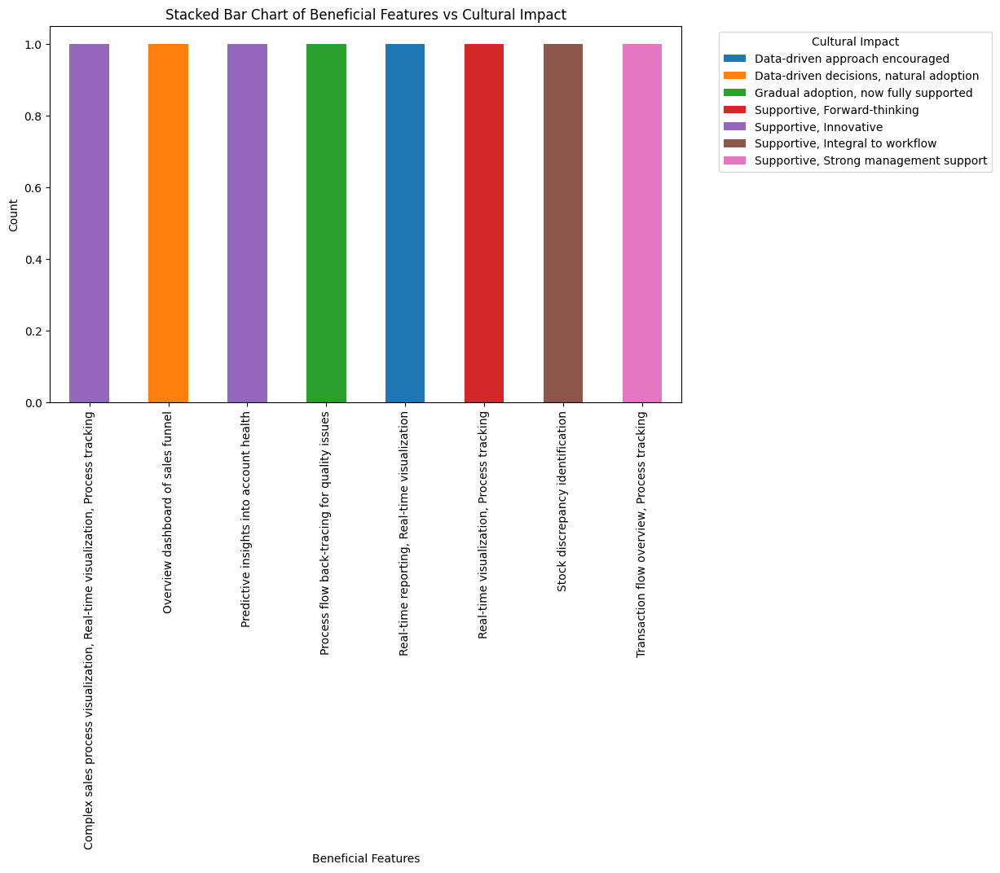

In [23]:
#Define a function to plot relationships between pairs of categorical columns for users
def plot_categorical_relations_users(df, categorical_columns):
    for col1 in categorical_columns:
        for col2 in categorical_columns:
            if col1 != col2:
                # Create a cross-tabulation table between two categorical columns
                crosstab = pd.crosstab(df[col1], df[col2], margins=False)

                # Plot a stacked bar chart to show the relationship between the two categories
                crosstab.plot(kind='bar', stacked=True, figsize=(10,6))
                plt.title(f'Stacked Bar Chart of {col1} vs {col2}')
                plt.xlabel(col1)
                plt.ylabel('Count')
                plt.legend(title=col2, bbox_to_anchor=(1.05, 1), loc='upper left')
                plt.tight_layout()
                plt.show()

# List of categorical columns to analyze for users (categorical variables)
categorical_columns_users = [    'Role Utilization', 'Training Provided', 'Improvement Example',
    'Suggestions', 'System Integration', 'Cultural Impact',
    'Beneficial Features']

# Call the function to plot the relationships for users
plot_categorical_relations_users(data_users, categorical_columns_users)
